In [4]:
from pathlib import Path # to interact with file system.

import numpy as np # for working with arrays.
import pandas as pd # for working with data frames (tables).

import seaborn as sns

from sklearn.model_selection import train_test_split # for data partition.
from sklearn.metrics import r2_score # to identify r_squared for regression model.
from sklearn.linear_model import LinearRegression # for linear regression model.
from sklearn.linear_model import LinearRegression, LogisticRegression, LogisticRegressionCV 
%matplotlib inline 
import matplotlib.pylab as plt
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor, plot_tree  # Decision trees
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier  # Ensemble methods
import statsmodels.api as sm  # Statistical models
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV  # Data partition and cross-validation
from sklearn.metrics import (accuracy_score, confusion_matrix, classification_report, 
                             ConfusionMatrixDisplay, r2_score) 
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors, KNeighborsClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from dmba import plotDecisionTree, classificationSummary, regressionSummary
from dmba import (plotDecisionTree, classificationSummary, regressionSummary, 
                  gainsChart, liftChart)  # DMBA utilities
from dmba.metric import AIC_score 
from matplotlib.ticker import FuncFormatter

In [6]:
credit_df = pd.read_csv('UCI_Credit_Card.csv')
credit_merge=credit_df.copy()
credit_v=credit_df.copy()

In [7]:
credit_v.rename(columns={
    "default.payment.next.month": "default", }, inplace=True)

In [8]:
fil = (credit_v.EDUCATION == 5) | (credit_v.EDUCATION == 6) | (credit_v.EDUCATION == 0)
credit_v.loc[fil, 'EDUCATION'] = 4
credit_v.EDUCATION.value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [9]:
# Mapping dictionary for EDUCATION column
education_mapping = {
    1: "Graduate school",
    2: "University",
    3: "High school",
    4: "Others"
}

# Replace the values in the EDUCATION column
credit_v['EDUCATION'] = credit_v['EDUCATION'].replace(education_mapping)

# Verify the changes
credit_v.head()


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,1,20000.0,2,University,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,University,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,University,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,University,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,University,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [10]:
credit_v.loc[credit_v.MARRIAGE == 0, 'MARRIAGE'] = 3
credit_v.MARRIAGE.value_counts()

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

In [11]:
# Mapping dictionary for EDUCATION column
marriage_mapping = {
    1: "Married",
    2: "Single",
    3: "Others"
}

# Replace the values in the EDUCATION column
credit_v['MARRIAGE'] = credit_v['MARRIAGE'].replace(marriage_mapping)

# Verify the changes
credit_v.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,1,20000.0,2,University,Married,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,University,Single,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,University,Single,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,University,Married,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,University,Married,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [12]:
# Mapping dictionary for EDUCATION column
gender_mapping = {
    1: "Male",
    2: "Female",
    
}

# Replace the values in the EDUCATION column
credit_v['SEX'] = credit_v['SEX'].replace(gender_mapping)

# Verify the changes
credit_v.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,1,20000.0,Female,University,Married,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,Female,University,Single,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,Female,University,Single,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,Female,University,Married,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,Male,University,Married,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [13]:
# Print unique values for specific columns
for column in ['SEX', 'EDUCATION', 'MARRIAGE']:
    print(f"Unique values in '{column}': {credit_v[column].unique()}")

Unique values in 'SEX': ['Female' 'Male']
Unique values in 'EDUCATION': ['University' 'Graduate school' 'High school' 'Others']
Unique values in 'MARRIAGE': ['Married' 'Single' 'Others']


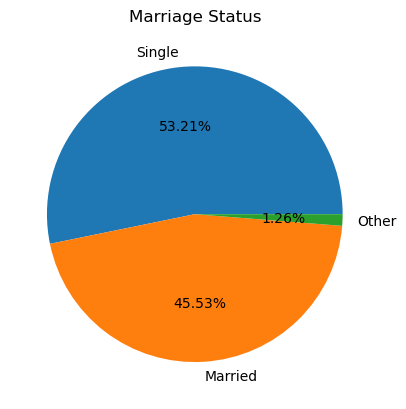

In [14]:
value_counts_marriage = credit_v['MARRIAGE'].value_counts()

plt.pie(value_counts_marriage, labels = ['Single','Married','Other'],autopct='%.2f%%' )
plt.title('Marriage Status')
plt.show()

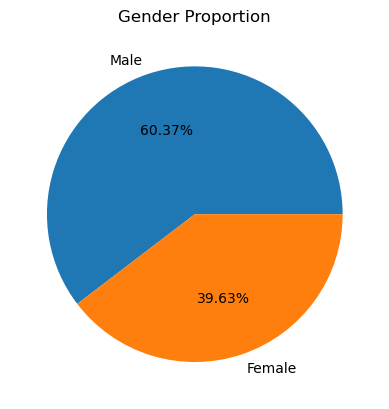

In [15]:
sex_calculation = credit_v['SEX'].value_counts()
#print(sex_calculation)
plt.pie(sex_calculation, labels = ['Male','Female'],autopct='%.2f%%')
plt.title("Gender Proportion")
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\1777854297.py:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


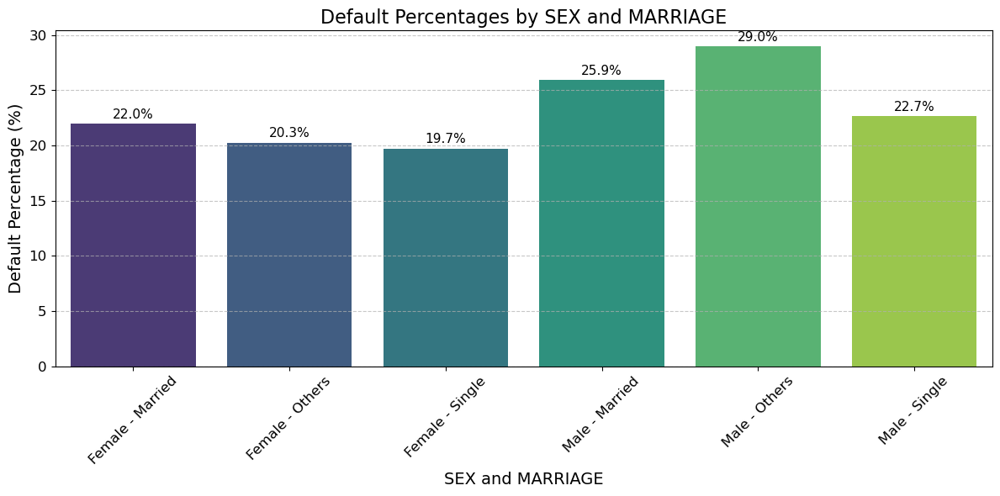

In [16]:
# Rename 'default.payment.next.month' to 'default' for simplicity
credit_v.rename(columns={'default.payment.next.month': 'default'}, inplace=True)

# Convert 'SEX' and 'MARRIAGE' to string for concatenation
credit_v['SEX'] = credit_v['SEX'].astype(str)
credit_v['MARRIAGE'] = credit_v['MARRIAGE'].astype(str)

# Creating a combined column to represent SEX and MARRIAGE
credit_v['SEX_MARRIAGE'] = credit_v['SEX'] + ' - ' + credit_v['MARRIAGE']

# Group by SEX_MARRIAGE and default to calculate counts
grouped = credit_v.groupby(['SEX_MARRIAGE', 'default']).size().unstack(fill_value=0)

# Calculate default percentages
grouped['Default_Percentage'] = grouped[1] / (grouped[0] + grouped[1]) * 100

# Reset index for plotting
percentage_data = grouped[['Default_Percentage']].reset_index()

# Plot the default percentages
plt.figure(figsize=(12, 6))
sns.barplot(
    x='SEX_MARRIAGE',
    y='Default_Percentage',
    data=percentage_data,
    palette='viridis'
)

# Add titles and labels
plt.title('Default Percentages by SEX and MARRIAGE', fontsize=16)
plt.xlabel('SEX and MARRIAGE', fontsize=14)
plt.ylabel('Default Percentage (%)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add percentage labels on bars
for i, row in percentage_data.iterrows():
    plt.text(
        i,
        row['Default_Percentage'] + 0.5,
        f"{row['Default_Percentage']:.1f}%",
        ha='center', fontsize=11, color='black'
    )

plt.tight_layout()
plt.show()

In [17]:
credit_v.AGE.describe()

count    30000.000000
mean        35.485500
std          9.217904
min         21.000000
25%         28.000000
50%         34.000000
75%         41.000000
max         79.000000
Name: AGE, dtype: float64

In [18]:
# Define age group bins and labels
bins = [20, 35, 50, 80]  # Bin edges for age groups
labels = ['Young', 'Middle', 'Old']  # Labels for age groups

# Create a new column for age groups
credit_v['Age_Group'] = pd.cut(credit_v['AGE'], bins=bins, labels=labels, right=False)

# Print the number of data points in each age group
age_group_counts = credit_v['Age_Group'].value_counts().reset_index()
age_group_counts.columns = ['Age_Group', 'Count']

print(age_group_counts)


  Age_Group  Count
0     Young  15696
1    Middle  11624
2       Old   2680


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\1173837249.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_age = credit_v.groupby('Age_Group')['default'].value_counts(normalize=True).unstack(fill_value=0)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\1173837249.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


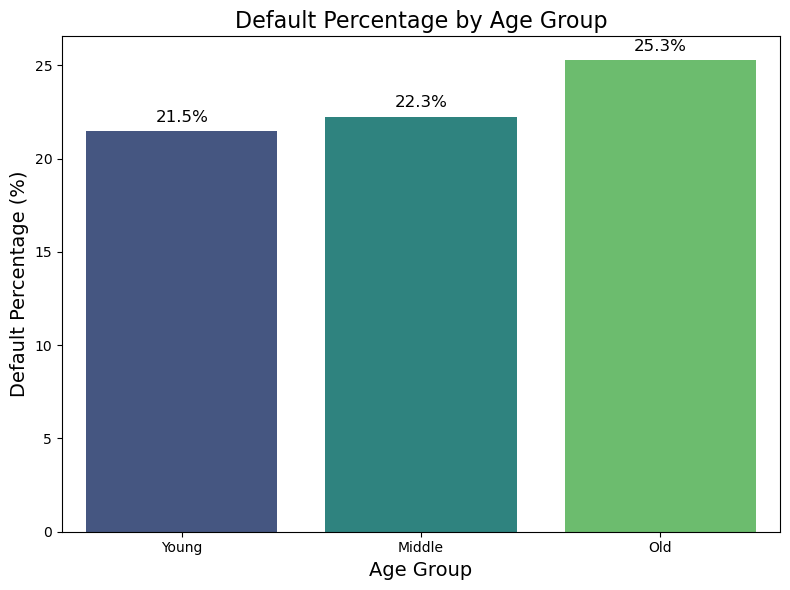

In [19]:
# Define age group bins and labels
bins = [20, 35, 50, 80]  # Bin edges for age groups
labels = ['Young', 'Middle', 'Old']  # Labels for age groups

# Create a new column for age groups
credit_v['Age_Group'] = pd.cut(credit_v['AGE'], bins=bins, labels=labels, right=False)

# Group data by Age_Group and calculate default counts and percentages
grouped_age = credit_v.groupby('Age_Group')['default'].value_counts(normalize=True).unstack(fill_value=0)

# Calculate default percentage
grouped_age['Default_Percentage'] = grouped_age[1] * 100  # Column '1' is defaulted (1)

# Reset index for visualization
age_percentage_data = grouped_age[['Default_Percentage']].reset_index()

# Plot the default percentages for age groups
plt.figure(figsize=(8, 6))
sns.barplot(
    x='Age_Group', 
    y='Default_Percentage', 
    data=age_percentage_data, 
    palette='viridis'
)

# Add titles and labels
plt.title('Default Percentage by Age Group', fontsize=16)
plt.xlabel('Age Group', fontsize=14)
plt.ylabel('Default Percentage (%)', fontsize=14)

# Add percentage labels on bars
for i, row in age_percentage_data.iterrows():
    plt.text(
        i, 
        row['Default_Percentage'] + 0.5, 
        f"{row['Default_Percentage']:.1f}%", 
        ha='center', fontsize=12, color='black'
    )

plt.tight_layout()
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3973760648.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  credit_v.groupby('Age_Group_10yr')['default']
C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3973760648.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


  Age_Group_10yr  Default_Percentage
0          20-29           22.842587
1          30-39           20.252714
2          40-49           22.973391
3          50-59           24.861170
4          60-69           28.343949
5          70-79           28.000000


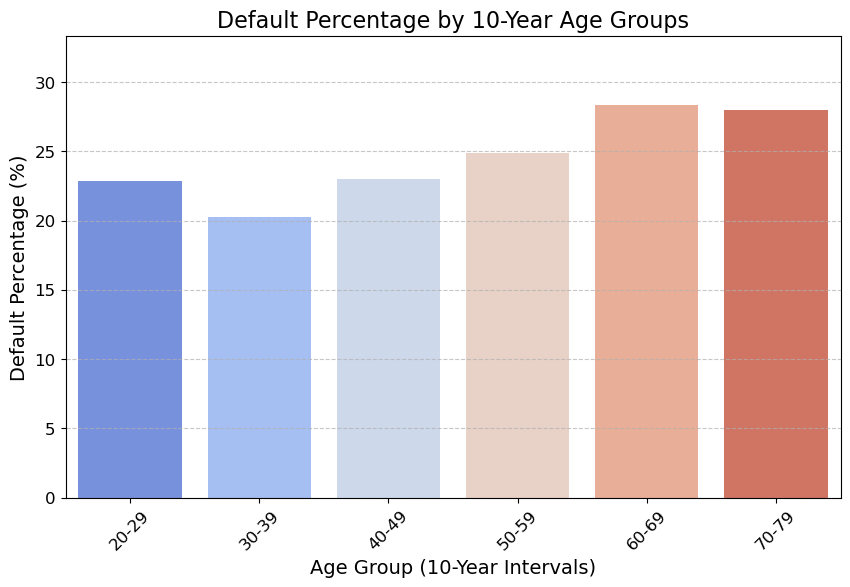

In [20]:
# Define bins and labels for 10-year age groups
bins = range(20, 81, 10)  # From 20 to 80 with intervals of 10
labels = [f'{bins[i]}-{bins[i+1] - 1}' for i in range(len(bins) - 1)]

# Create the age group column
credit_v['Age_Group_10yr'] = pd.cut(credit_v['AGE'], bins=bins, labels=labels, right=False)

# Calculate default percentage for each 10-year age group
age_group_default_10yr_summary = (
    credit_v.groupby('Age_Group_10yr')['default']
    .mean()
    .reset_index()
    .rename(columns={'default': 'Default_Percentage'})
)

# Convert to percentage
age_group_default_10yr_summary['Default_Percentage'] *= 100

# Display the data
print(age_group_default_10yr_summary)

# Visualization of default percentage by 10-year age group
plt.figure(figsize=(10, 6))
sns.barplot(
    x='Age_Group_10yr',
    y='Default_Percentage',
    data=age_group_default_10yr_summary,
    palette='coolwarm'
)
plt.title('Default Percentage by 10-Year Age Groups', fontsize=16)
plt.xlabel('Age Group (10-Year Intervals)', fontsize=14)
plt.ylabel('Default Percentage (%)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, age_group_default_10yr_summary['Default_Percentage'].max() + 5)  # Add space above max value
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [21]:
credit_v.rename(columns={
    "default.payment.next.month": "default", 
    'PAY_0': 'status_sept', 
    'PAY_2': 'status_aug', 
    'PAY_3': 'status_jul', 
    'PAY_4': 'status_jun', 
    'PAY_5': 'status_may', 
    'PAY_6': 'status_apr'
}, inplace=True)

# Print the updated column names
credit_v.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5',
       'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5',
       'PAY_AMT6', 'default', 'SEX_MARRIAGE', 'Age_Group', 'Age_Group_10yr'],
      dtype='object')

In [22]:
# Mapping dictionary with shorter names using "d"
status_mapping = {
    -2: "No use",
    -1: "Paid full",
    0: "Revolving",
    1: "1d",
    2: "2d",
    3: "3d",
    4: "4d",
    5: "5d",
    6: "6d",
    7: "7d",
    8: "8d",
    9: "9+d"
}

# Apply the mapping to all status columns
status_columns = ['status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']

credit_v[status_columns] = credit_v[status_columns].replace(status_mapping)

# Verify the changes
print(credit_v[status_columns].head())

  status_sept status_aug status_jul status_jun status_may status_apr
0          2d         2d  Paid full  Paid full     No use     No use
1   Paid full         2d  Revolving  Revolving  Revolving         2d
2   Revolving  Revolving  Revolving  Revolving  Revolving  Revolving
3   Revolving  Revolving  Revolving  Revolving  Revolving  Revolving
4   Paid full  Revolving  Paid full  Revolving  Revolving  Revolving


Unique values in status columns:
status_sept: ['2d' 'Paid full' 'Revolving' 'No use' '1d' '3d' '4d' '8d' '7d' '5d' '6d']
status_aug: ['2d' 'Revolving' 'Paid full' 'No use' '3d' '5d' '7d' '4d' '1d' '6d' '8d']
status_jul: ['Paid full' 'Revolving' '2d' 'No use' '3d' '4d' '6d' '7d' '1d' '5d' '8d']
status_jun: ['Paid full' 'Revolving' 'No use' '2d' '3d' '4d' '5d' '7d' '6d' '1d' '8d']
status_may: ['No use' 'Revolving' 'Paid full' '2d' '3d' '5d' '4d' '7d' '8d' '6d']
status_apr: ['No use' '2d' 'Revolving' 'Paid full' '3d' '6d' '4d' '7d' '8d' '5d']
Rows with valid statuses in status_sept: 29981


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


Rows with valid statuses in status_aug: 29999


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


Rows with valid statuses in status_jul: 29997
Rows with valid statuses in status_jun: 29998


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


Rows with valid statuses in status_may: 29999


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


Rows with valid statuses in status_apr: 29998


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\3406289642.py:47: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


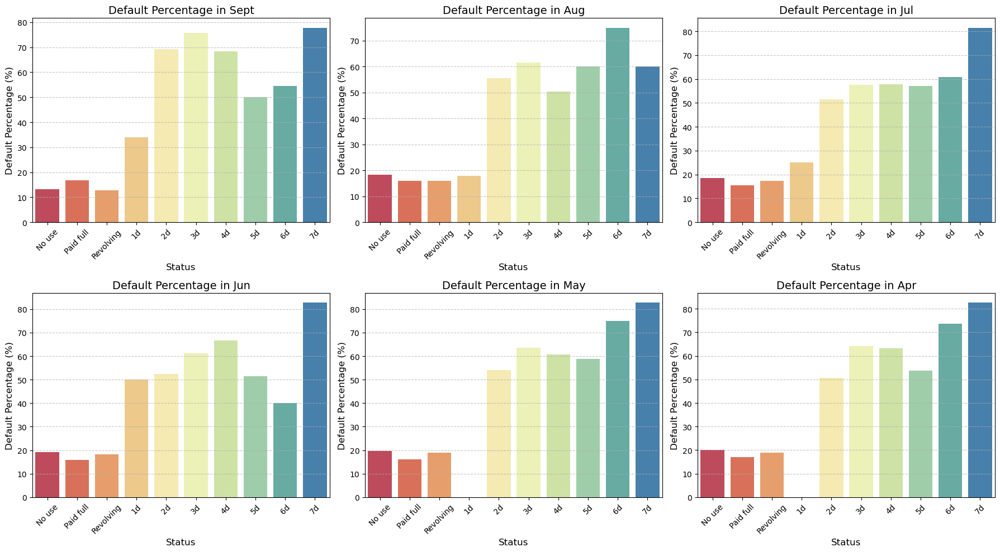

In [23]:

# Check for repayment statuses in status columns
status_columns = ['status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']
print("Unique values in status columns:")
for col in status_columns:
    print(f"{col}: {credit_v[col].unique()}")

# Updated Mapping of repayment statuses
status_mapping = {
    "No use": "No use", "Paid full": "Paid full", "Revolving": "Revolving",
    "1d": "1d", "2d": "2d", "3d": "3d", "4d": "4d", "5d": "5d", "6d": "6d", "7d": "7d"
}

# Valid statuses for filtering
status_order = ["No use", "Paid full", "Revolving", "1d", "2d", "3d", "4d", "5d", "6d", "7d"]

# 2x3 grid for visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()  # Flatten the grid for iteration

# Loop through each column and plot
for i, col in enumerate(status_columns):
    # Check for valid statuses
    filtered_data = credit_v[credit_v[col].isin(status_order)]

    # Debugging: Check the number of rows after filtering
    print(f"Rows with valid statuses in {col}: {len(filtered_data)}")

    # Calculate default percentages
    status_default_summary = (
        filtered_data.groupby(col)['default']
        .mean()
        .reset_index()
        .rename(columns={'default': 'Default_Percentage'})
    )

    # Convert to percentage
    status_default_summary['Default_Percentage'] *= 100

    # Sort and preserve order
    status_default_summary[col] = pd.Categorical(
        status_default_summary[col], categories=status_order, ordered=True
    )
    status_default_summary = status_default_summary.sort_values(by=col)

    # Plot the data if not empty
    if not status_default_summary.empty:
        sns.barplot(
            x=col,
            y='Default_Percentage',
            data=status_default_summary,
            palette='Spectral',
            ax=axes[i]
        )
        axes[i].set_title(f"Default Percentage in {col.split('_')[1].capitalize()}", fontsize=14)
        axes[i].set_xlabel('Status', fontsize=12)
        axes[i].set_ylabel('Default Percentage (%)', fontsize=12)
        axes[i].tick_params(axis='x', rotation=45)
        axes[i].grid(axis='y', linestyle='--', alpha=0.7)
    else:
        axes[i].text(0.5, 0.5, "No Data Available", ha='center', va='center', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()

In [24]:
credit_v.rename(columns={
    'BILL_AMT1': 'bill_sept',
    'BILL_AMT2': 'bill_aug',
    'BILL_AMT3': 'bill_jul',
    'BILL_AMT4': 'bill_jun',
    'BILL_AMT5': 'bill_may',
    'BILL_AMT6': 'bill_apr',
    'PAY_AMT1': 'paid_sept',
    'PAY_AMT2': 'paid_aug',
    'PAY_AMT3': 'paid_jul',
    'PAY_AMT4': 'paid_jun',
    'PAY_AMT5': 'paid_may',
    'PAY_AMT6': 'paid_apr'
}, inplace=True)

# Print the updated column names
credit_v.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr',
       'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default', 'SEX_MARRIAGE', 'Age_Group', 'Age_Group_10yr'],
      dtype='object')

In [25]:
# Clean column names to remove leading/trailing spaces or hidden characters
credit_v.columns = credit_v.columns.str.strip()

# Verify cleaned column names
print(credit_v.columns)


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr',
       'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default', 'SEX_MARRIAGE', 'Age_Group', 'Age_Group_10yr'],
      dtype='object')


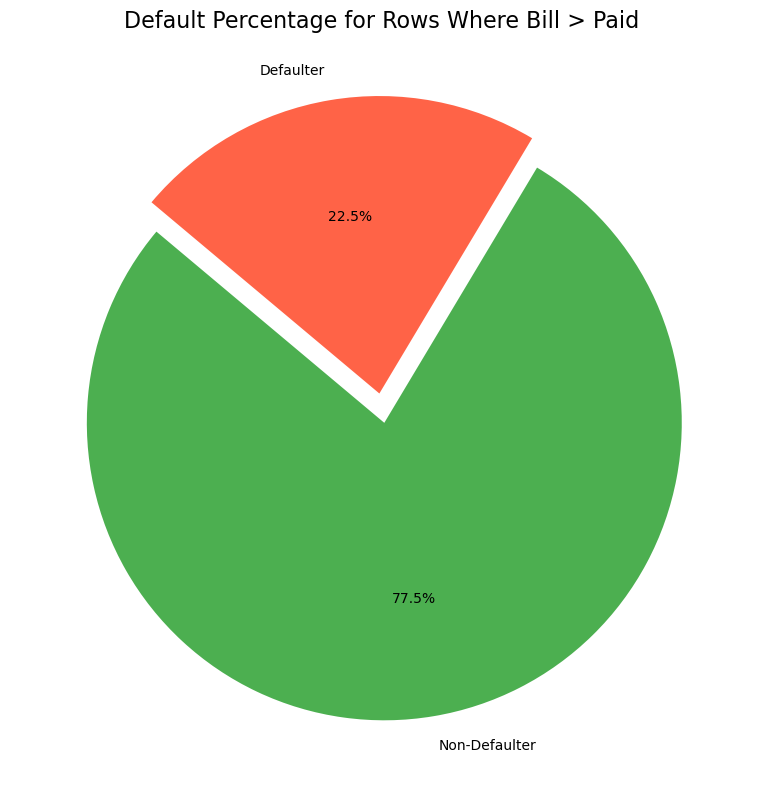

In [26]:
# Sum the bill and paid amounts for all months
credit_v['total_bill'] = credit_v[['bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr']].sum(axis=1)
credit_v['total_paid'] = credit_v[['paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr']].sum(axis=1)

# Create a new column that checks if total bill is greater than total paid
credit_v['bill_greater_than_paid'] = credit_v['total_bill'] > credit_v['total_paid']

# Filter data where bill > paid
filtered_data = credit_v[credit_v['bill_greater_than_paid']]

# Calculate percentages of defaulters and non-defaulters
default_counts = filtered_data['default'].value_counts(normalize=True) * 100
default_labels = ['Non-Defaulter', 'Defaulter']

# Visualization of the default percentages as a pie chart
plt.figure(figsize=(8, 8))
colors = ['#4CAF50', '#FF6347']  # Green for Non-Defaulter, Red for Defaulter

plt.pie(
    default_counts, 
    labels=default_labels, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=colors,
    explode=[0.05, 0.05]  # Slight separation for both segments
)

# Customize the title
plt.title('Default Percentage for Rows Where Bill > Paid', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\4087782084.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


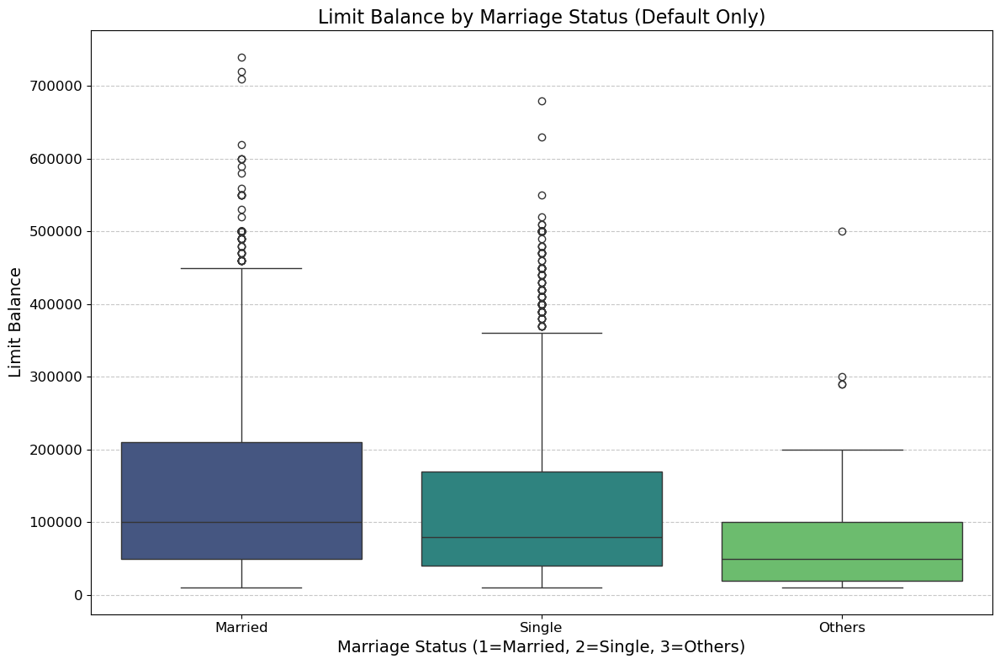

In [27]:
# Filter the data to include only rows where default == 1
default_data = credit_v[credit_v['default'] == 1]

# Setting up the plot
plt.figure(figsize=(12, 8))

# Creating the box plot for "Default" only
sns.boxplot(
    x='MARRIAGE', 
    y='LIMIT_BAL', 
    data=default_data, 
    palette='viridis'
)

# Adding titles and labels
plt.title('Limit Balance by Marriage Status (Default Only)', fontsize=16)
plt.xlabel('Marriage Status (1=Married, 2=Single, 3=Others)', fontsize=14)
plt.ylabel('Limit Balance', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adding a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Showing the plot
plt.tight_layout()
plt.show()

C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\60175355.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


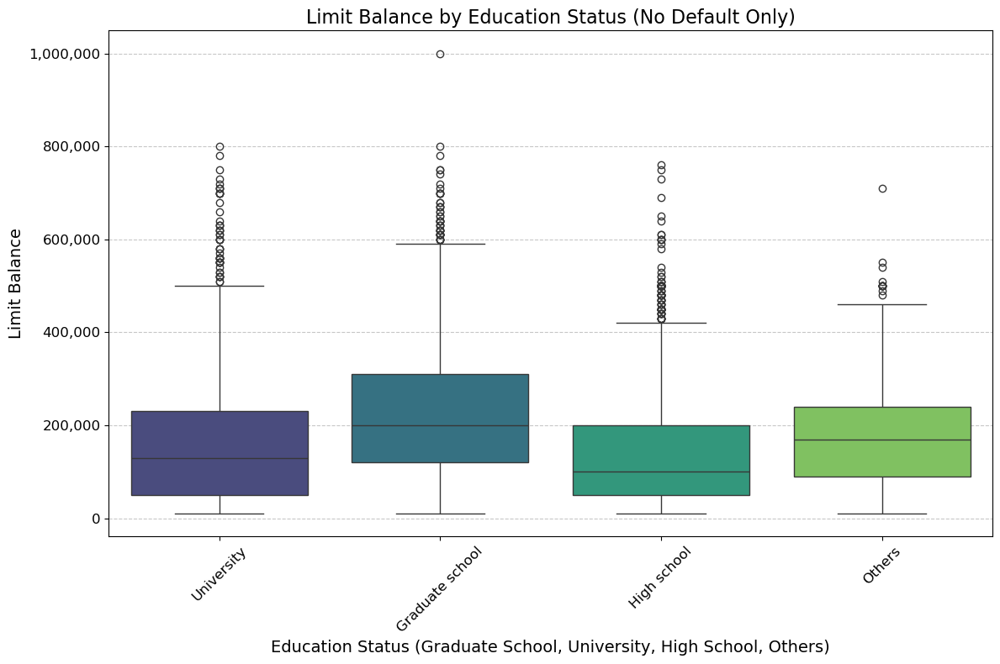

In [28]:

# Filter the data to include only rows where default == 0
default_data = credit_v[credit_v['default'] == 0]

# Setting up the plot
plt.figure(figsize=(12, 8))

# Creating the box plot for Education with Default only
sns.boxplot(
    x='EDUCATION', 
    y='LIMIT_BAL', 
    data=default_data, 
    palette='viridis'
)

# Adding titles and labels
plt.title('Limit Balance by Education Status (No Default Only)', fontsize=16)
plt.xlabel('Education Status (Graduate School, University, High School, Others)', fontsize=14)
plt.ylabel('Limit Balance', fontsize=14)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Format y-axis to show plain numbers (no scientific notation)
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))

# Adding a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Showing the plot
plt.tight_layout()
plt.show()

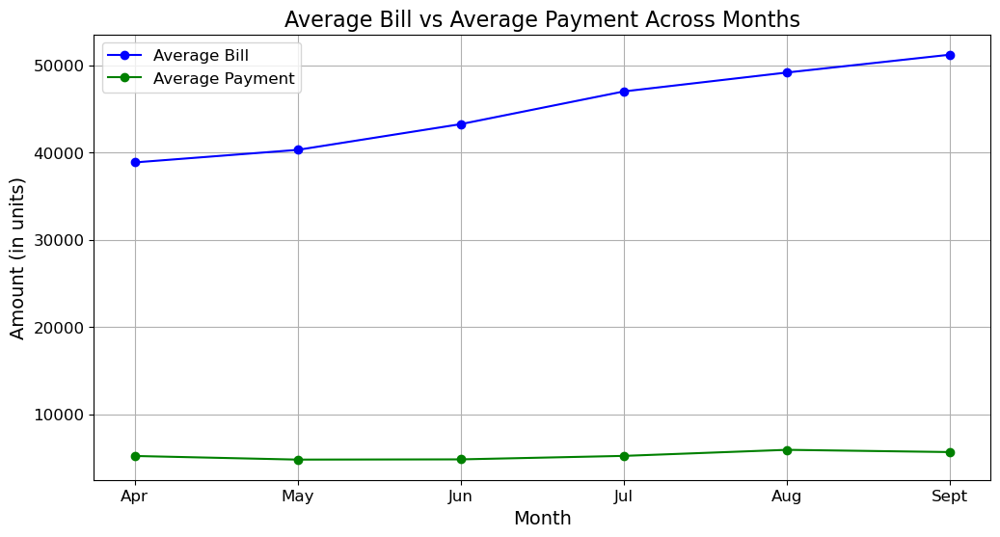

In [29]:
# Plotting bills and payments across months
months = ['Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sept']
bill_columns = ['bill_apr', 'bill_may', 'bill_jun', 'bill_jul', 'bill_aug', 'bill_sept']
paid_columns = ['paid_apr', 'paid_may', 'paid_jun', 'paid_jul', 'paid_aug', 'paid_sept']

plt.figure(figsize=(12, 6))

# Plotting bills
plt.plot(months, credit_v[bill_columns].mean(), label='Average Bill', marker='o', linestyle='-', color='blue')

# Plotting payments
plt.plot(months, credit_v[paid_columns].mean(), label='Average Payment', marker='o', linestyle='-', color='green')

# Adding title and labels
plt.title('Average Bill vs Average Payment Across Months', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Amount (in units)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

plt.grid(True)
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\878873281.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  credit_v['due_ratio'].replace([float('inf'), -float('inf')], float('nan'), inplace=True)
C:\Users\Admin\AppData\Local\Temp\ipykernel_18484\878873281.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting val

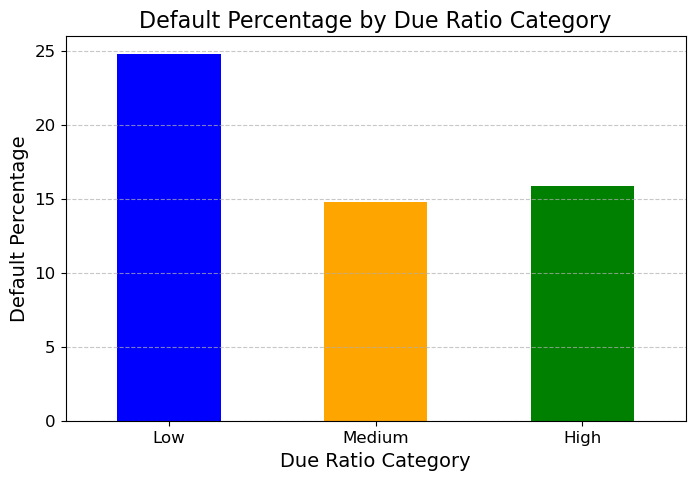

In [30]:
# Calculate the due ratio for each data point
credit_v['due_ratio'] = credit_v[['paid_apr', 'paid_may', 'paid_jun', 'paid_jul', 'paid_aug', 'paid_sept']].sum(axis=1) / \
                         credit_v[['bill_apr', 'bill_may', 'bill_jun', 'bill_jul', 'bill_aug', 'bill_sept']].sum(axis=1)

# Handle infinite and NaN values in the due ratio
credit_v['due_ratio'].replace([float('inf'), -float('inf')], float('nan'), inplace=True)
credit_v['due_ratio'].fillna(0, inplace=True)

# Categorize due ratios into bins: low, medium, high
bins = [0, 0.5, 1, float('inf')]
labels = ['Low', 'Medium', 'High']
credit_v['due_ratio_category'] = pd.cut(credit_v['due_ratio'], bins=bins, labels=labels, right=False)

# Calculate the default percentages for each due ratio category
default_percentage_due_ratio = credit_v.groupby('due_ratio_category')['default'].mean() * 100

# Visualize the results
import matplotlib.pyplot as plt

# Plotting the default percentages for each due ratio category
plt.figure(figsize=(8, 5))
default_percentage_due_ratio.plot(kind='bar', color=['blue', 'orange', 'green'])

# Adding labels and title
plt.title('Default Percentage by Due Ratio Category', fontsize=16)
plt.xlabel('Due Ratio Category', fontsize=14)
plt.ylabel('Default Percentage', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.show()


In [31]:
credit_df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [32]:
credit_df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [33]:
print("Missing values per column:")
print(credit_df.isnull().sum())

# Check if there are any missing values in the dataset
if credit_df.isnull().values.any():
    print("\nThere are missing values in the dataset.")
else:
    print("\nNo missing values in the dataset.")

Missing values per column:
ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

No missing values in the dataset.


In [34]:
credit_df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [35]:
credit_df.LIMIT_BAL.describe()

count      30000.000000
mean      167484.322667
std       129747.661567
min        10000.000000
25%        50000.000000
50%       140000.000000
75%       240000.000000
max      1000000.000000
Name: LIMIT_BAL, dtype: float64

In [36]:
credit_df[['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']].describe()

,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100
std,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988
min,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000
25%,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000


In [37]:
# Print unique values for specific columns
for column1 in ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']:
    print(f"Unique values in '{column1}': {credit_df[column1].unique()}")

Unique values in 'PAY_0': [ 2 -1  0 -2  1  3  4  8  7  5  6]
Unique values in 'PAY_2': [ 2  0 -1 -2  3  5  7  4  1  6  8]
Unique values in 'PAY_3': [-1  0  2 -2  3  4  6  7  1  5  8]
Unique values in 'PAY_4': [-1  0 -2  2  3  4  5  7  6  1  8]
Unique values in 'PAY_5': [-2  0 -1  2  3  5  4  7  8  6]
Unique values in 'PAY_6': [-2  2  0 -1  3  6  4  7  8  5]


In [38]:
credit_df.rename(columns={
    "default.payment.next.month": "default", 
    'PAY_0': 'status_sept', 
    'PAY_2': 'status_aug', 
    'PAY_3': 'status_jul', 
    'PAY_4': 'status_jun', 
    'PAY_5': 'status_may', 
    'PAY_6': 'status_apr'
}, inplace=True)

# Print the updated column names
credit_df.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5',
       'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5',
       'PAY_AMT6', 'default'],
      dtype='object')

In [39]:
credit_df.rename(columns={
    'BILL_AMT1': 'bill_sept',
    'BILL_AMT2': 'bill_aug',
    'BILL_AMT3': 'bill_jul',
    'BILL_AMT4': 'bill_jun',
    'BILL_AMT5': 'bill_may',
    'BILL_AMT6': 'bill_apr',
    'PAY_AMT1': 'paid_sept',
    'PAY_AMT2': 'paid_aug',
    'PAY_AMT3': 'paid_jul',
    'PAY_AMT4': 'paid_jun',
    'PAY_AMT5': 'paid_may',
    'PAY_AMT6': 'paid_apr'
}, inplace=True)

# Print the updated column names
credit_df.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr',
       'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default'],
      dtype='object')

In [40]:
# Mapping dictionary with shorter names using "d"
status_mapping = {
    -2: "No use",
    -1: "Paid full",
    0: "Revolving",
    1: "1d",
    2: "2d",
    3: "3d",
    4: "4d",
    5: "5d",
    6: "6d",
    7: "7d",
    8: "8d",
    9: "9+d"
}

# Apply the mapping to all status columns
status_columns = ['status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']

credit_df[status_columns] = credit_df[status_columns].replace(status_mapping)

# Verify the changes
print(credit_df[status_columns].head())


  status_sept status_aug status_jul status_jun status_may status_apr
0          2d         2d  Paid full  Paid full     No use     No use
1   Paid full         2d  Revolving  Revolving  Revolving         2d
2   Revolving  Revolving  Revolving  Revolving  Revolving  Revolving
3   Revolving  Revolving  Revolving  Revolving  Revolving  Revolving
4   Paid full  Revolving  Paid full  Revolving  Revolving  Revolving


In [41]:
# Print unique values for specific columns
for column in ['SEX', 'EDUCATION', 'MARRIAGE']:
    print(f"Unique values in '{column}': {credit_df[column].unique()}")

Unique values in 'SEX': [2 1]
Unique values in 'EDUCATION': [2 1 3 5 4 6 0]
Unique values in 'MARRIAGE': [1 2 3 0]


In [42]:
fil = (credit_df.EDUCATION == 5) | (credit_df.EDUCATION == 6) | (credit_df.EDUCATION == 0)
credit_df.loc[fil, 'EDUCATION'] = 4
credit_df.EDUCATION.value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [43]:
# Mapping dictionary for EDUCATION column
education_mapping = {
    1: "Graduate school",
    2: "University",
    3: "High school",
    4: "Others"
}

# Replace the values in the EDUCATION column
credit_df['EDUCATION'] = credit_df['EDUCATION'].replace(education_mapping)

# Verify the changes
credit_df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,status_sept,status_aug,status_jul,status_jun,...,bill_jun,bill_may,bill_apr,paid_sept,paid_aug,paid_jul,paid_jun,paid_may,paid_apr,default
0,1,20000.0,2,University,1,24,2d,2d,Paid full,Paid full,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,University,2,26,Paid full,2d,Revolving,Revolving,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,University,2,34,Revolving,Revolving,Revolving,Revolving,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,University,1,37,Revolving,Revolving,Revolving,Revolving,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,University,1,57,Paid full,Revolving,Paid full,Revolving,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [44]:
credit_df.loc[credit_df.MARRIAGE == 0, 'MARRIAGE'] = 3
credit_df.MARRIAGE.value_counts()

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

In [45]:
# Mapping dictionary for EDUCATION column
marriage_mapping = {
    1: "Married",
    2: "Single",
    3: "Others"
}

# Replace the values in the EDUCATION column
credit_df['MARRIAGE'] = credit_df['MARRIAGE'].replace(marriage_mapping)

# Verify the changes
credit_df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,status_sept,status_aug,status_jul,status_jun,...,bill_jun,bill_may,bill_apr,paid_sept,paid_aug,paid_jul,paid_jun,paid_may,paid_apr,default
0,1,20000.0,2,University,Married,24,2d,2d,Paid full,Paid full,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,University,Single,26,Paid full,2d,Revolving,Revolving,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,University,Single,34,Revolving,Revolving,Revolving,Revolving,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,University,Married,37,Revolving,Revolving,Revolving,Revolving,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,University,Married,57,Paid full,Revolving,Paid full,Revolving,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [46]:
# Print unique values for specific columns
for column in ['SEX', 'EDUCATION', 'MARRIAGE']:
    print(f"Unique values in '{column}': {credit_df[column].unique()}")

Unique values in 'SEX': [2 1]
Unique values in 'EDUCATION': ['University' 'Graduate school' 'High school' 'Others']
Unique values in 'MARRIAGE': ['Married' 'Single' 'Others']


In [47]:
credit_df.dtypes

ID               int64
LIMIT_BAL      float64
SEX              int64
EDUCATION       object
MARRIAGE        object
AGE              int64
status_sept     object
status_aug      object
status_jul      object
status_jun      object
status_may      object
status_apr      object
bill_sept      float64
bill_aug       float64
bill_jul       float64
bill_jun       float64
bill_may       float64
bill_apr       float64
paid_sept      float64
paid_aug       float64
paid_jul       float64
paid_jun       float64
paid_may       float64
paid_apr       float64
default          int64
dtype: object

In [48]:
# Convert columns to categorical data type
credit_df['SEX'] = credit_df['SEX'].astype('category')
credit_df['EDUCATION'] = credit_df['EDUCATION'].astype('category')
credit_df['MARRIAGE'] = credit_df['MARRIAGE'].astype('category')

# Convert status columns to categorical
status_columns = ['status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']
credit_df[status_columns] = credit_df[status_columns].apply(lambda x: x.astype('category'))

# Verify the data types
print(credit_df.dtypes)


ID                int64
LIMIT_BAL       float64
SEX            category
EDUCATION      category
MARRIAGE       category
AGE               int64
status_sept    category
status_aug     category
status_jul     category
status_jun     category
status_may     category
status_apr     category
bill_sept       float64
bill_aug        float64
bill_jul        float64
bill_jun        float64
bill_may        float64
bill_apr        float64
paid_sept       float64
paid_aug        float64
paid_jul        float64
paid_jun        float64
paid_may        float64
paid_apr        float64
default           int64
dtype: object


In [49]:
#One hot encoding

In [50]:
# Select the categorical columns to one-hot encode
categorical_columns = ['SEX', 'EDUCATION', 'MARRIAGE', 'status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']

# One-hot encode only the selected columns
credit_df = pd.get_dummies(credit_df, columns=categorical_columns, prefix_sep='_', drop_first=True)

# Check the resulting columns
print(credit_df.columns)


Index(['ID', 'LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default', 'SEX_2',
       'EDUCATION_High school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Others', 'MARRIAGE_Single', 'status_sept_2d',
       'status_sept_3d', 'status_sept_4d', 'status_sept_5d', 'status_sept_6d',
       'status_sept_7d', 'status_sept_8d', 'status_sept_No use',
       'status_sept_Paid full', 'status_sept_Revolving', 'status_aug_2d',
       'status_aug_3d', 'status_aug_4d', 'status_aug_5d', 'status_aug_6d',
       'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'stat

In [51]:
credit_df.head()

,ID,LIMIT_BAL,AGE,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,paid_sept,...,status_may_Revolving,status_apr_3d,status_apr_4d,status_apr_5d,status_apr_6d,status_apr_7d,status_apr_8d,status_apr_No use,status_apr_Paid full,status_apr_Revolving
0,1,20000.0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,...,False,False,False,False,False,False,False,True,False,False
1,2,120000.0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,...,True,False,False,False,False,False,False,False,False,False
2,3,90000.0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,...,True,False,False,False,False,False,False,False,False,True
3,4,50000.0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,...,True,False,False,False,False,False,False,False,False,True
4,5,50000.0,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,...,True,False,False,False,False,False,False,False,False,True


In [52]:
credit_df.dtypes

ID                        int64
LIMIT_BAL               float64
AGE                       int64
bill_sept               float64
bill_aug                float64
                         ...   
status_apr_7d              bool
status_apr_8d              bool
status_apr_No use          bool
status_apr_Paid full       bool
status_apr_Revolving       bool
Length: 80, dtype: object

In [53]:
# Convert the True/False columns to 1/0
credit_df = credit_df.astype({col: 'int' for col in credit_df.select_dtypes(include=['bool']).columns})

# Check the data types to confirm the change
print(credit_df.dtypes)


ID                        int64
LIMIT_BAL               float64
AGE                       int64
bill_sept               float64
bill_aug                float64
                         ...   
status_apr_7d             int32
status_apr_8d             int32
status_apr_No use         int32
status_apr_Paid full      int32
status_apr_Revolving      int32
Length: 80, dtype: object


In [54]:
credit_df.head()

,ID,LIMIT_BAL,AGE,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,paid_sept,...,status_may_Revolving,status_apr_3d,status_apr_4d,status_apr_5d,status_apr_6d,status_apr_7d,status_apr_8d,status_apr_No use,status_apr_Paid full,status_apr_Revolving
0,1,20000.0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0
1,2,120000.0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,...,1,0,0,0,0,0,0,0,0,0
2,3,90000.0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,...,1,0,0,0,0,0,0,0,0,1
3,4,50000.0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,...,1,0,0,0,0,0,0,0,0,1
4,5,50000.0,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,...,1,0,0,0,0,0,0,0,0,1


In [55]:
# Display the datatypes of all columns in the credit_df DataFrame
print(credit_df.dtypes)


ID                        int64
LIMIT_BAL               float64
AGE                       int64
bill_sept               float64
bill_aug                float64
                         ...   
status_apr_7d             int32
status_apr_8d             int32
status_apr_No use         int32
status_apr_Paid full      int32
status_apr_Revolving      int32
Length: 80, dtype: object


In [56]:
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 80 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     30000 non-null  int64  
 1   LIMIT_BAL              30000 non-null  float64
 2   AGE                    30000 non-null  int64  
 3   bill_sept              30000 non-null  float64
 4   bill_aug               30000 non-null  float64
 5   bill_jul               30000 non-null  float64
 6   bill_jun               30000 non-null  float64
 7   bill_may               30000 non-null  float64
 8   bill_apr               30000 non-null  float64
 9   paid_sept              30000 non-null  float64
 10  paid_aug               30000 non-null  float64
 11  paid_jul               30000 non-null  float64
 12  paid_jun               30000 non-null  float64
 13  paid_may               30000 non-null  float64
 14  paid_apr               30000 non-null  float64
 15  de

In [57]:
# Drop the 'ID' column
credit_df = credit_df.drop(columns=['ID'])

# Verify the change
print(credit_df.head())


   LIMIT_BAL  AGE  bill_sept  bill_aug  bill_jul  bill_jun  bill_may  \
0    20000.0   24     3913.0    3102.0     689.0       0.0       0.0   
1   120000.0   26     2682.0    1725.0    2682.0    3272.0    3455.0   
2    90000.0   34    29239.0   14027.0   13559.0   14331.0   14948.0   
3    50000.0   37    46990.0   48233.0   49291.0   28314.0   28959.0   
4    50000.0   57     8617.0    5670.0   35835.0   20940.0   19146.0   

   bill_apr  paid_sept  paid_aug  ...  status_may_Revolving  status_apr_3d  \
0       0.0        0.0     689.0  ...                     0              0   
1    3261.0        0.0    1000.0  ...                     1              0   
2   15549.0     1518.0    1500.0  ...                     1              0   
3   29547.0     2000.0    2019.0  ...                     1              0   
4   19131.0     2000.0   36681.0  ...                     1              0   

   status_apr_4d  status_apr_5d  status_apr_6d  status_apr_7d  status_apr_8d  \
0              0  

In [58]:
credit_df.columns

Index(['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr', 'default', 'SEX_2', 'EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', '

#KNN ALL POSSIBLE PREDICTORS 

In [59]:

# random_state is set to a defined value to get the same partitions when re-running the code
trainData= credit_df.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData = credit_df.drop(trainData.index)

print('Training   : ', trainData.shape)
print('Validation : ', validData.shape)
print()


Training   :  (18000, 79)
Validation :  (12000, 79)



In [60]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']])  # Note the use of an array of column names

# Transform the full dataset
creditNorm = pd.concat([pd.DataFrame(scaler.transform(credit_df[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']]), 
                                    columns=['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr']),
                       credit_df[['default', 'EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']]], axis=1)
trainNorm = creditNorm.iloc[trainData.index]


In [61]:
trainNorm.head()

,zLIMIT_BAL,zAGE,zbill_sept,zbill_aug,zbill_jul,zbill_jun,zbill_may,zbill_apr,zpaid_sept,zpaid_aug,...,status_may_Revolving,status_apr_3d,status_apr_4d,status_apr_5d,status_apr_6d,status_apr_7d,status_apr_8d,status_apr_No use,status_apr_Paid full,status_apr_Revolving
10747,1.099300,-0.378032,1.628269,1.426730,0.884288,0.624296,0.275879,-0.420397,0.153510,0.003306,...,1,0,0,0,0,0,0,0,0,1
12573,-1.213773,1.458122,-0.698124,-0.699011,-0.684321,-0.647184,-0.648018,-0.640676,-0.337390,-0.245363,...,0,0,0,0,0,0,0,0,0,0
29676,-0.905364,-0.810068,-0.692764,-0.694029,-0.020800,0.033820,-0.645376,0.076057,-0.337390,1.671752,...,0,0,0,0,0,0,0,0,1,0
8856,-0.674056,1.782149,-0.204981,-0.145070,-0.107698,-0.046559,-0.017123,0.019793,-0.118423,-0.179051,...,0,0,0,0,0,0,0,0,0,0
21098,0.790890,-0.162014,-0.416018,-0.454284,-0.378400,-0.327972,-0.413916,-0.367462,-0.337390,-0.079584,...,0,0,0,0,0,0,0,0,0,1


In [62]:
validNorm = creditNorm.iloc[validData.index]
validNorm.head()

,zLIMIT_BAL,zAGE,zbill_sept,zbill_aug,zbill_jul,zbill_jun,zbill_may,zbill_apr,zpaid_sept,zpaid_aug,...,status_may_Revolving,status_apr_3d,status_apr_4d,status_apr_5d,status_apr_6d,status_apr_7d,status_apr_8d,status_apr_No use,status_apr_Paid full,status_apr_Revolving
1,-0.365646,-1.026086,-0.662435,-0.670024,-0.635903,-0.622856,-0.610225,-0.601873,-0.337390,-0.203918,...,1,0,0,0,0,0,0,0,0,0
9,-1.136671,-0.054005,-0.698555,-0.694029,-0.673762,-0.673172,-0.454418,-0.424575,-0.337390,-0.245363,...,0,0,0,0,0,0,0,0,1,0
10,0.251173,-0.162014,-0.549428,-0.557833,-0.595630,-0.634528,-0.636763,-0.594050,-0.200920,-0.244866,...,1,0,0,0,0,0,0,0,1,0
14,0.636685,-0.702059,0.256123,0.239179,0.223463,0.244819,0.261134,0.267904,-0.159849,-0.121028,...,1,0,0,0,0,0,0,0,0,1
15,-0.905364,-1.350113,-0.016906,-0.288057,-0.276877,-0.230739,-0.184887,-0.153260,-0.337390,-0.183196,...,1,0,0,0,0,0,0,0,0,1


In [63]:
knn = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']], trainNorm['default'])


In [64]:
valid_pred=knn.predict(validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']])

In [65]:
accuracy_score(validNorm['default'], valid_pred)

0.7798333333333334

In [66]:
train_X = trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']]
train_y = trainNorm['default']
valid_X = validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']]
valid_y = validNorm['default']

# Train a classifier for different values of k
results = []
for k in range(1, 173):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    results.append({
        'k': k,
        'accuracy': accuracy_score(valid_y, knn.predict(valid_X))
    })

# Convert results to a pandas data frame
results = pd.DataFrame(results)
print(results)

       k  accuracy
0      1  0.725917
1      2  0.787417
2      3  0.779833
3      4  0.800750
4      5  0.796917
..   ...       ...
167  168  0.810583
168  169  0.810833
169  170  0.810333
170  171  0.810500
171  172  0.809917

[172 rows x 2 columns]


In [ ]:
#knn best K 
train_X = trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']]
train_y = trainNorm['default']
valid_X = validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']]
valid_y = validNorm['default']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

In [ ]:
knn_1 = KNeighborsClassifier(n_neighbors=18).fit(trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']], trainNorm['default'])

In [ ]:
valid_pred_bestk=knn_1.predict(validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single','SEX_2','status_sept_2d', 'status_sept_3d', 'status_sept_4d',
       'status_sept_5d', 'status_sept_6d', 'status_sept_7d', 'status_sept_8d',
       'status_sept_No use', 'status_sept_Paid full', 'status_sept_Revolving',
       'status_aug_2d', 'status_aug_3d', 'status_aug_4d', 'status_aug_5d',
       'status_aug_6d', 'status_aug_7d', 'status_aug_8d', 'status_aug_No use',
       'status_aug_Paid full', 'status_aug_Revolving', 'status_jul_2d',
       'status_jul_3d', 'status_jul_4d', 'status_jul_5d', 'status_jul_6d',
       'status_jul_7d', 'status_jul_8d', 'status_jul_No use',
       'status_jul_Paid full', 'status_jul_Revolving', 'status_jun_2d',
       'status_jun_3d', 'status_jun_4d', 'status_jun_5d', 'status_jun_6d',
       'status_jun_7d', 'status_jun_8d', 'status_jun_No use',
       'status_jun_Paid full', 'status_jun_Revolving', 'status_may_3d',
       'status_may_4d', 'status_may_5d', 'status_may_6d', 'status_may_7d',
       'status_may_8d', 'status_may_No use', 'status_may_Paid full',
       'status_may_Revolving', 'status_apr_3d', 'status_apr_4d',
       'status_apr_5d', 'status_apr_6d', 'status_apr_7d', 'status_apr_8d',
       'status_apr_No use', 'status_apr_Paid full', 'status_apr_Revolving']])

In [ ]:
accuracy_score(validNorm['default'], valid_pred_bestk)

In [ ]:
cm_mer_VALID= confusion_matrix(validNorm['default'] ,valid_pred_bestk)
cm_display_merVALID= ConfusionMatrixDisplay(confusion_matrix=cm_mer_VALID, display_labels=knn_1.classes_)
cm_display_merVALID.plot(cmap='Blues')

In [ ]:
#LOGISTIC 

In [ ]:
X=creditNorm.drop(columns=['default'])
y=creditNorm['default']

In [ ]:
logit_reg = sm.GLM(y, X, family=sm.families.Binomial())

#Fit and print results

logit_reg.fit()
print(logit_reg.fit().summary())
print(y.head())

In [ ]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

In [ ]:
logit_reg_pred = logit_reg.predict(valid_X)
logit_reg_proba = logit_reg.predict_proba(valid_X)
logit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in logit_reg_proba],
                             'p(1)': [p[1] for p in logit_reg_proba],
                             'predicted': logit_reg_pred })

In [ ]:
classificationSummary(valid_y, logit_reg_pred)

In [ ]:
# Define a range of cutoffs
cutoff_range = np.arange(0.1, 0.8, 0.1)

# Initialize a dictionary to store results
confusion_matrices = {}

# Iterate through each cutoff
for cutoff in cutoff_range:
    # Generate predictions based on the current cutoff
    logit_reg_pred_custom = [1 if p[1] >= cutoff else 0 for p in logit_reg_proba]
    
    # Compute confusion matrix
    cm = confusion_matrix(valid_y, logit_reg_pred_custom)
    
    # Store the confusion matrix for the current cutoff
    confusion_matrices[cutoff] = cm

    # Print the classification summary for the current cutoff
    print(f"Cutoff: {cutoff}")
    classificationSummary(valid_y, logit_reg_pred_custom)
    print(f"Confusion Matrix:\n{cm}\n")

# You can now access confusion_matrices for analysis

In [ ]:
df = logit_result.sort_values(by=['p(1)'], ascending=False)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

gainsChart(df.actual, ax=axes[0])
liftChart(df.actual, title='Decile-wise lift chart', ax=axes[1])
    
plt.tight_layout()
plt.show()

In [ ]:
# Initialize a list to store results
cutoffs = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
results = []

# Loop through each cutoff value
for cutoff in cutoffs:
    # Apply the cutoff
    logit_reg_pred2 = logit_reg_proba[:, 1] > cutoff
    logit_reg_pred3 = logit_reg_pred2.astype(int)
    
    # Calculate classification summary for the current cutoff
    tp = sum((valid_y == 1) & (logit_reg_pred3 == 1))  # True positives
    fp = sum((valid_y == 0) & (logit_reg_pred3 == 1))  # False positives
    tn = sum((valid_y == 0) & (logit_reg_pred3 == 0))  # True negatives
    fn = sum((valid_y == 1) & (logit_reg_pred3 == 0))  # False negatives
    
    # Calculate metrics
    accuracy = (tp + tn) / len(valid_y)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    
    # Append results
    results.append([cutoff, accuracy, precision, recall, specificity, tp, fp, tn, fn])

# Convert the results to a DataFrame for display
import pandas as pd
results_df = pd.DataFrame(results, columns=["Cutoff", "Accuracy", "Precision", "Recall", "Specificity", "TP", "FP", "TN", "FN"])

# Display the DataFrame
print("Classification Summary by Cutoff")
print(results_df)

In [ ]:
from sklearn.metrics import roc_auc_score
import pandas as pd

# Initialize a list to store results
cutoffs = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
results = []

# Loop through each cutoff value
for cutoff in cutoffs:
    # Apply the cutoff
    logit_reg_pred2 = logit_reg_proba[:, 1] > cutoff
    logit_reg_pred3 = logit_reg_pred2.astype(int)
    
    # Calculate classification summary for the current cutoff
    tp = sum((valid_y == 1) & (logit_reg_pred3 == 1))  # True positives
    fp = sum((valid_y == 0) & (logit_reg_pred3 == 1))  # False positives
    tn = sum((valid_y == 0) & (logit_reg_pred3 == 0))  # True negatives
    fn = sum((valid_y == 1) & (logit_reg_pred3 == 0))  # False negatives
    
    # Calculate metrics
    accuracy = (tp + tn) / len(valid_y)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    roc_auc = roc_auc_score(valid_y, logit_reg_proba[:, 1])  # Calculate ROC-AUC for the probabilities
    
    # Append results
    results.append([cutoff, accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn])

# Convert the results to a DataFrame for display
results_df = pd.DataFrame(results, columns=["Cutoff", "Accuracy", "Precision", "Recall", "Specificity", "ROC-AUC", "TP", "FP", "TN", "FN"])

# Display the DataFrame
print("Classification Summary by Cutoff")
print(results_df)


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each predictor
X = creditNorm.drop(columns=['default'])  # Drop the target variable
X = sm.add_constant(X)  # Add constant for intercept
vif_data = pd.DataFrame()
vif_data["Feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF scores
print(vif_data)


In [ ]:
# Compute pairwise correlation matrix
correlation_matrix = X.corr()

# Identify highly correlated predictors (correlation > 0.9)
high_corr_pairs = correlation_matrix[correlation_matrix > 0.9].stack().reset_index()
high_corr_pairs = high_corr_pairs[high_corr_pairs['level_0'] != high_corr_pairs['level_1']]
print("Highly Correlated Predictors:\n", high_corr_pairs)

In [ ]:
# Compute pairwise correlation matrix
correlation_matrix = X.corr()

# Identify highly correlated pairs (correlation > 0.9)
high_corr_pairs = (
    correlation_matrix[correlation_matrix > 0.7]
    .stack()
    .reset_index()
    .rename(columns={0: 'correlation'})
)

# Filter out self-correlations
high_corr_pairs = high_corr_pairs[
    (high_corr_pairs['level_0'] != high_corr_pairs['level_1'])
]

# Remove duplicate pairs (e.g., keep only one direction of correlation pairs)
high_corr_pairs = high_corr_pairs[
    high_corr_pairs['level_0'] < high_corr_pairs['level_1']
]

print("Highly Correlated Predictors:\n", high_corr_pairs)

# Select predictors to drop (keep the second variable of each pair)
to_drop = set(high_corr_pairs['level_1'])
print(f"Predictors to drop due to high correlation: {to_drop}")

# Drop the redundant predictors and create a new DataFrame
reduced = X.drop(columns=to_drop)

# Display the reduced DataFrame
print("New DataFrame after removing highly correlated predictors:")
print(reduced.shape)

In [ ]:
reduced=pd.concat([reduced,creditNorm['default']], axis=1)
print(len(reduced.columns))

In [ ]:

X_reduced = reduced.drop(columns=['default'])  # Adjust 'default' to your target column name
y_reduced = reduced['default']
# partition data
newtrain_X, newvalid_X, newtrain_y, newvalid_y = train_test_split(X, y, test_size=0.4, random_state=1)

# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
newlogit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
newlogit_reg.fit(newtrain_X, newtrain_y)

#Get intercepts, coefficients, and AIC
print('intercept ', newlogit_reg.intercept_[0])
print(pd.DataFrame({'coeff': newlogit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, newlogit_reg.predict(newvalid_X), df = len(newtrain_X.columns) + 1))
print(newtrain_X.shape)
print(newvalid_X.shape)

In [ ]:
newlogit_reg_pred = newlogit_reg.predict(newvalid_X)
newlogit_reg_proba = newlogit_reg.predict_proba(newvalid_X)
newlogit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in newlogit_reg_proba],
                             'p(1)': [p[1] for p in newlogit_reg_proba],
                           'predicted': newlogit_reg_pred })

# display four different cases (Ignore this, Wanted to show one example of each cell in the confusion matrix, but doesn't always work with different random seed_
#newlogit_result.head

In [ ]:
#Use the classification summary function for training and validation data
classificationSummary(newvalid_y, newlogit_reg_pred)

In [ ]:
from sklearn.metrics import roc_auc_score
import pandas as pd

# Initialize a list to store results
cutoffs = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
results = []

# Loop through each cutoff value
for cutoff in cutoffs:
    # Apply the cutoff
    newlogit_reg_pred2 = newlogit_reg_proba[:, 1] > cutoff
    newlogit_reg_pred3 = newlogit_reg_pred2.astype(int)
    
    # Calculate classification summary for the current cutoff
    tp = sum((newvalid_y == 1) & (newlogit_reg_pred3 == 1))  # True positives
    fp = sum((newvalid_y == 0) & (newlogit_reg_pred3 == 1))  # False positives
    tn = sum((newvalid_y == 0) & (newlogit_reg_pred3 == 0))  # True negatives
    fn = sum((newvalid_y == 1) & (newlogit_reg_pred3 == 0))  # False negatives
    
    # Calculate metrics
    accuracy = (tp + tn) / len(newvalid_y)
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    roc_auc = roc_auc_score(newvalid_y, newlogit_reg_proba[:, 1])  # Calculate ROC-AUC for the probabilities
    
    # Append results
    results.append([cutoff, accuracy, precision, recall, specificity, roc_auc, tp, fp, tn, fn])

# Convert the results to a DataFrame for display
newresults_df = pd.DataFrame(results, columns=["Cutoff", "Accuracy", "Precision", "Recall", "Specificity", "ROC-AUC", "TP", "FP", "TN", "FN"])

# Display the DataFrame
print("Classification Summary by Cutoff")
print(newresults_df)


In [ ]:
#TREES 


In [ ]:
# Prepare features and target variable
X = credit_df.drop(columns=['default'])
y = credit_df['default']

In [ ]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

In [ ]:
# Train a basic Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on the test set and evaluate
y_pred = dt_model.predict(X_test)
print("Basic Decision Tree Performance:")
print(classification_report(y_test, y_pred))

In [ ]:
# Plot the basic decision tree
plt.figure(figsize=(15, 10))
plot_tree(dt_model, feature_names=X_train.columns, class_names=["No Default", "Default"], filled=True)
plt.title("Basic Decision Tree")
plt.show()

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Optimized Tree")
plt.show()

In [ ]:
# Perform Grid Search for hyperparameter tuning
param_grid = {
    'max_depth': [2, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_impurity_decrease': [0.0, 0.0005, 0.001, 0.005]
}
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

In [ ]:
# Best parameters from Grid Search
best_params = grid_search.best_params_
print("Best Parameters from Grid Search:", best_params)

In [ ]:
#implementing the result
Credit_default_Tree2 = DecisionTreeClassifier(max_depth=5, 
        min_impurity_decrease=0.001, min_samples_split=2)
Credit_default_Tree2.fit(X_train, y_train)

# Display classification tree for training partition.
print('grid search Control Parameters')
plotDecisionTree(Credit_default_Tree2, feature_names=X_train.columns)

In [ ]:
#checking for validation
classificationSummary(y_train, Credit_default_Tree2.predict(X_train))

In [ ]:
classificationSummary(y_test, Credit_default_Tree2.predict(X_test))

In [ ]:
#further trying random forrest
rf = RandomForestClassifier(n_estimators=700, random_state=1)
rf.fit(X_train, y_train)

In [ ]:
classificationSummary(y_test, rf.predict(X_test))

In [ ]:
# Assuming rf (RandomForest model) is already trained, and X_train is the training data
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# Create a DataFrame with feature importances
df1 = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})

# Sort the DataFrame by the importance column
df1 = df1.sort_values('importance', ascending=True)  # Use df1 instead of credit_df

# Plot feature importances
ax = df1.plot(kind='barh', xerr='std', x='feature', y='importance', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()


In [ ]:
boost = GradientBoostingClassifier()
boost.fit(X_train, y_train)

In [ ]:
classificationSummary(y_test, boost.predict(X_test))

In [207]:
# Data processing handling the defaults and payment history column


In [208]:
credit_merge.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default.payment.next.month'],
      dtype='object')

In [209]:
credit_merge.rename(columns={
    'BILL_AMT1': 'bill_sept',
    'BILL_AMT2': 'bill_aug',
    'BILL_AMT3': 'bill_jul',
    'BILL_AMT4': 'bill_jun',
    'BILL_AMT5': 'bill_may',
    'BILL_AMT6': 'bill_apr',
    'PAY_AMT1': 'paid_sept',
    'PAY_AMT2': 'paid_aug',
    'PAY_AMT3': 'paid_jul',
    'PAY_AMT4': 'paid_jun',
    'PAY_AMT5': 'paid_may',
    'PAY_AMT6': 'paid_apr'
}, inplace=True)

# Print the updated column names
credit_merge.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'bill_sept', 'bill_aug',
       'bill_jul', 'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug',
       'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default.payment.next.month'],
      dtype='object')

In [210]:
fil = (credit_merge.EDUCATION == 5) | (credit_merge.EDUCATION == 6) | (credit_merge.EDUCATION == 0)
credit_merge.loc[fil, 'EDUCATION'] = 4
credit_merge.EDUCATION.value_counts()

EDUCATION
2    14030
1    10585
3     4917
4      468
Name: count, dtype: int64

In [211]:
# Update the 'SEX' column: Female (2) becomes 0, Male (1) remains 1
credit_merge['SEX'] = credit_merge['SEX'].apply(lambda x: 0 if x == 2 else 1)

# Check the unique values to verify the changes
print(credit_merge['SEX'].unique())


[0 1]


In [212]:
credit_merge.loc[credit_merge.MARRIAGE == 0, 'MARRIAGE'] = 3
credit_merge.MARRIAGE.value_counts()

MARRIAGE
2    15964
1    13659
3      377
Name: count, dtype: int64

In [213]:
# Mapping dictionary for EDUCATION column
marriage_mapping = {
    1: "Married",
    2: "Single",
    3: "Others"
}

# Replace the values in the EDUCATION column
credit_merge['MARRIAGE'] = credit_merge['MARRIAGE'].replace(marriage_mapping)

# Verify the changes
credit_merge.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,bill_jun,bill_may,bill_apr,paid_sept,paid_aug,paid_jul,paid_jun,paid_may,paid_apr,default.payment.next.month
0,1,20000.0,0,2,Married,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,0,2,Single,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,0,2,Single,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,0,2,Married,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,Married,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [214]:
# Mapping dictionary for EDUCATION column
education_mapping = {
    1: "Graduate school",
    2: "University",
    3: "High school",
    4: "Others"
}

# Replace the values in the EDUCATION column
credit_merge['EDUCATION'] = credit_merge['EDUCATION'].replace(education_mapping)

# Verify the changes
credit_merge.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,bill_jun,bill_may,bill_apr,paid_sept,paid_aug,paid_jul,paid_jun,paid_may,paid_apr,default.payment.next.month
0,1,20000.0,0,University,Married,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,0,University,Single,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,0,University,Single,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,0,University,Married,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,University,Married,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [215]:
# Print unique values for specific columns
for column1 in ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']:
    print(f"Unique values in '{column1}': {credit_merge[column1].unique()}")

Unique values in 'PAY_0': [ 2 -1  0 -2  1  3  4  8  7  5  6]
Unique values in 'PAY_2': [ 2  0 -1 -2  3  5  7  4  1  6  8]
Unique values in 'PAY_3': [-1  0  2 -2  3  4  6  7  1  5  8]
Unique values in 'PAY_4': [-1  0 -2  2  3  4  5  7  6  1  8]
Unique values in 'PAY_5': [-2  0 -1  2  3  5  4  7  8  6]
Unique values in 'PAY_6': [-2  2  0 -1  3  6  4  7  8  5]


In [216]:
credit_v2 = credit_merge.copy()

In [217]:
# Define a function to map repayment status
def map_repayment_status(value):
    if value in [-2, -1, 0]:
        return 'no_issue'
    elif value == 1:
        return 'first_time_default'
    elif value in [2, 3]:
        return 'short_term_default'
    else:
        return 'long_term_default'

# Apply mapping to all PAY_* columns
pay_columns = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
for col in pay_columns:
    credit_merge[col] = credit_merge[col].apply(map_repayment_status)

# Check the unique values after transformation
for col in pay_columns:
    print(f"Unique values in '{col}': {credit_merge[col].unique()}")


Unique values in 'PAY_0': ['short_term_default' 'no_issue' 'first_time_default' 'long_term_default']
Unique values in 'PAY_2': ['short_term_default' 'no_issue' 'long_term_default' 'first_time_default']
Unique values in 'PAY_3': ['no_issue' 'short_term_default' 'long_term_default' 'first_time_default']
Unique values in 'PAY_4': ['no_issue' 'short_term_default' 'long_term_default' 'first_time_default']
Unique values in 'PAY_5': ['no_issue' 'short_term_default' 'long_term_default']
Unique values in 'PAY_6': ['no_issue' 'short_term_default' 'long_term_default']


In [166]:
credit_merge.rename(columns={
    "default.payment.next.month": "default", 
    'PAY_0': 'status_sept', 
    'PAY_2': 'status_aug', 
    'PAY_3': 'status_jul', 
    'PAY_4': 'status_jun', 
    'PAY_5': 'status_may', 
    'PAY_6': 'status_apr'
}, inplace=True)

# Print the updated column names
credit_merge.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr',
       'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default'],
      dtype='object')

In [167]:
# List of columns to convert
categorical_columns = ['EDUCATION', 'MARRIAGE', 
                       'status_sept', 'status_aug', 'status_jul', 
                       'status_jun', 'status_may', 'status_apr']

# Convert columns to category type
credit_merge[categorical_columns] = credit_merge[categorical_columns].astype('category')

# Verify the changes
#print(credit_merge.dtypes)


In [168]:
# Select the categorical columns to one-hot encode
categorical_columns = ['EDUCATION', 'MARRIAGE', 'status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']

# One-hot encode only the selected columns
credit_merge = pd.get_dummies(credit_merge, columns=categorical_columns, prefix_sep='_', drop_first=False)

# Drop the 'no_issue' category (if it exists)
credit_merge = credit_merge.loc[:, ~credit_merge.columns.str.contains('no_issue')]

# Check the resulting columns
print(credit_merge.columns)


Index(['ID', 'LIMIT_BAL', 'SEX', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default',
       'EDUCATION_Graduate school', 'EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Married',
       'MARRIAGE_Others', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default'],
      dtype='object')


In [169]:
# Replace spaces with underscores in column names
credit_merge.columns = credit_merge.columns.str.replace(' ', '_')

In [170]:
# Drop the first column for each of the categorical columns to avoid multicollinearity
credit_merge.drop(columns=['EDUCATION_Graduate_school', 'MARRIAGE_Others'], inplace=True)

# Check the updated columns
print(credit_merge.columns)


Index(['ID', 'LIMIT_BAL', 'SEX', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default', 'EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Married',
       'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default'],
      dtype='object')


In [171]:
# Convert the True/False columns to 1/0
credit_merge = credit_merge.astype({col: 'int' for col in credit_merge.select_dtypes(include=['bool']).columns})

# Check the data types to confirm the change
print(credit_merge.dtypes)

ID                                  int64
LIMIT_BAL                         float64
SEX                                 int64
AGE                                 int64
bill_sept                         float64
bill_aug                          float64
bill_jul                          float64
bill_jun                          float64
bill_may                          float64
bill_apr                          float64
paid_sept                         float64
paid_aug                          float64
paid_jul                          float64
paid_jun                          float64
paid_may                          float64
paid_apr                          float64
default                             int64
EDUCATION_High_school               int32
EDUCATION_Others                    int32
EDUCATION_University                int32
MARRIAGE_Married                    int32
MARRIAGE_Single                     int32
status_sept_first_time_default      int32
status_sept_long_term_default     

In [172]:
# Drop the 'ID' column
credit_merge = credit_merge.drop(columns=['ID'])

# Verify the change
print(credit_merge.head())

   LIMIT_BAL  SEX  AGE  bill_sept  bill_aug  bill_jul  bill_jun  bill_may  \
0    20000.0    0   24     3913.0    3102.0     689.0       0.0       0.0   
1   120000.0    0   26     2682.0    1725.0    2682.0    3272.0    3455.0   
2    90000.0    0   34    29239.0   14027.0   13559.0   14331.0   14948.0   
3    50000.0    0   37    46990.0   48233.0   49291.0   28314.0   28959.0   
4    50000.0    1   57     8617.0    5670.0   35835.0   20940.0   19146.0   

   bill_apr  paid_sept  ...  status_jul_first_time_default  \
0       0.0        0.0  ...                              0   
1    3261.0        0.0  ...                              0   
2   15549.0     1518.0  ...                              0   
3   29547.0     2000.0  ...                              0   
4   19131.0     2000.0  ...                              0   

   status_jul_long_term_default  status_jul_short_term_default  \
0                             0                              0   
1                             0 

In [173]:

# random_state is set to a defined value to get the same partitions when re-running the code
trainData= credit_merge.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData = credit_merge.drop(trainData.index)

print('Training   : ', trainData.shape)
print('Validation : ', validData.shape)

Training   :  (18000, 37)
Validation :  (12000, 37)


In [174]:
# normalizing using standard scaler 

In [40]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']])  # Note the use of an array of column names

# Transform the full dataset
creditNorm = pd.concat([pd.DataFrame(scaler.transform(credit_merge[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']]), 
                                    columns=['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr']),
                       credit_merge[['default', 'EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Married',
       'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']]], axis=1)
trainNorm = creditNorm.iloc[trainData.index]
validNorm = creditNorm.iloc[validData.index]
validNorm.head()

,zLIMIT_BAL,zAGE,zbill_sept,zbill_aug,zbill_jul,zbill_jun,zbill_may,zbill_apr,zpaid_sept,zpaid_aug,...,status_jul_first_time_default,status_jul_long_term_default,status_jul_short_term_default,status_jun_first_time_default,status_jun_long_term_default,status_jun_short_term_default,status_may_long_term_default,status_may_short_term_default,status_apr_long_term_default,status_apr_short_term_default
1,-0.365646,-1.026086,-0.662435,-0.670024,-0.635903,-0.622856,-0.610225,-0.601873,-0.337390,-0.203918,...,0,0,0,0,0,0,0,0,0,1
9,-1.136671,-0.054005,-0.698555,-0.694029,-0.673762,-0.673172,-0.454418,-0.424575,-0.337390,-0.245363,...,0,0,0,0,0,0,0,0,0,0
10,0.251173,-0.162014,-0.549428,-0.557833,-0.595630,-0.634528,-0.636763,-0.594050,-0.200920,-0.244866,...,0,0,1,0,0,0,0,0,0,0
14,0.636685,-0.702059,0.256123,0.239179,0.223463,0.244819,0.261134,0.267904,-0.159849,-0.121028,...,0,0,0,0,0,0,0,0,0,0
15,-0.905364,-1.350113,-0.016906,-0.288057,-0.276877,-0.230739,-0.184887,-0.153260,-0.337390,-0.183196,...,0,0,0,0,0,0,0,0,0,0


In [41]:
knn_mer= KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']], trainNorm['default'])

In [42]:
valid_pred=knn_mer.predict(validNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']])

In [43]:
accuracy_score(validNorm['default'], valid_pred)

0.77725

In [44]:
#knn best K 
train_X = trainNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']]
train_y = trainNorm['default']
valid_X = validNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']]
valid_y = validNorm['default']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

     k  accuracy
0    1  0.729667
1    2  0.787583
2    3  0.777250
3    4  0.800583
4    5  0.796000
5    6  0.805000
6    7  0.802083
7    8  0.807583
8    9  0.806583
9   10  0.810917
10  11  0.808250
11  12  0.812750
12  13  0.810667
13  14  0.813583
14  15  0.813667
15  16  0.814667
16  17  0.813917
17  18  0.814667
18  19  0.812750
19  20  0.814167
20  21  0.814167
21  22  0.814000
22  23  0.813250
23  24  0.814000
24  25  0.813750
25  26  0.813417
26  27  0.813583
27  28  0.813167
28  29  0.813333
29  30  0.813250
30  31  0.812917
31  32  0.812917
32  33  0.812833
33  34  0.813833
34  35  0.813833
35  36  0.813667
36  37  0.813583
37  38  0.813417
38  39  0.814000
Max Accuracy: 0.8146666666666667 at k = 16


In [ ]:
# updating the best K 

In [45]:
knn_mer_b = KNeighborsClassifier(n_neighbors=16).fit(trainNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']], trainNorm['default'])

In [46]:
valid_pred_bestk=knn_mer_b.predict(validNorm[['zLIMIT_BAL', 'zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul',
       'zbill_jun', 'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug',
       'zpaid_jul', 'zpaid_jun', 'zpaid_may', 'zpaid_apr', 
       'EDUCATION_High_school', 'EDUCATION_Others', 'EDUCATION_University',
       'MARRIAGE_Married', 'MARRIAGE_Single', 'status_sept_first_time_default',
       'status_sept_long_term_default', 'status_sept_short_term_default',
       'status_aug_first_time_default', 'status_aug_long_term_default',
       'status_aug_short_term_default', 'status_jul_first_time_default',
       'status_jul_long_term_default', 'status_jul_short_term_default',
       'status_jun_first_time_default', 'status_jun_long_term_default',
       'status_jun_short_term_default', 'status_may_long_term_default',
       'status_may_short_term_default', 'status_apr_long_term_default',
       'status_apr_short_term_default']])

In [47]:
accuracy_score(validNorm['default'], valid_pred_bestk)

0.8146666666666667

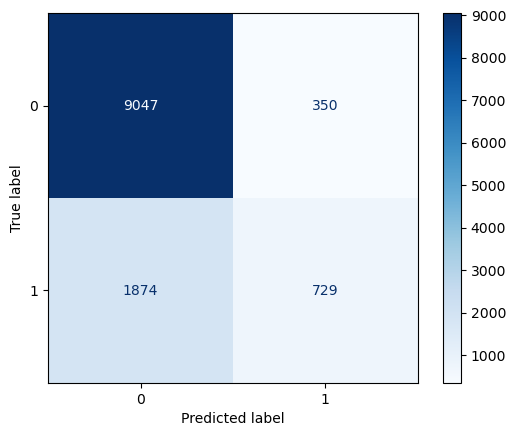

In [48]:
cm_mer_VALID= confusion_matrix(validNorm['default'] ,valid_pred_bestk)
cm_display_merVALID= ConfusionMatrixDisplay(confusion_matrix=cm_mer_VALID, display_labels=knn_mer_b.classes_)
cm_display_merVALID.plot(cmap='Blues')

In [ ]:
# decison trees where repayment columns are merged 

In [51]:
credit_merge.head()

,LIMIT_BAL,SEX,AGE,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,paid_sept,...,status_jul_first_time_default,status_jul_long_term_default,status_jul_short_term_default,status_jun_first_time_default,status_jun_long_term_default,status_jun_short_term_default,status_may_long_term_default,status_may_short_term_default,status_apr_long_term_default,status_apr_short_term_default
0,20000.0,0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,120000.0,0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,0.0,...,0,0,0,0,0,0,0,0,0,1
2,90000.0,0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,1518.0,...,0,0,0,0,0,0,0,0,0,0
3,50000.0,0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,2000.0,...,0,0,0,0,0,0,0,0,0,0
4,50000.0,1,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,2000.0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
# Prepare features and target variable
X = credit_merge.drop(columns=['default'])
y = credit_merge['default']

In [53]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

In [61]:
# Train a basic Decision Tree
basic_mer_model = DecisionTreeClassifier(random_state=1)
basic_mer_model.fit(X_train, y_train)

# Predict on the test set and evaluate
y_pred = basic_mer_model.predict(X_test)
print("Basic Decision Tree Performance:")
print(classification_report(y_test, y_pred))

Basic Decision Tree Performance:
              precision    recall  f1-score   support

           0       0.83      0.82      0.82      9322
           1       0.39      0.40      0.40      2678

    accuracy                           0.72     12000
   macro avg       0.61      0.61      0.61     12000
weighted avg       0.73      0.72      0.73     12000



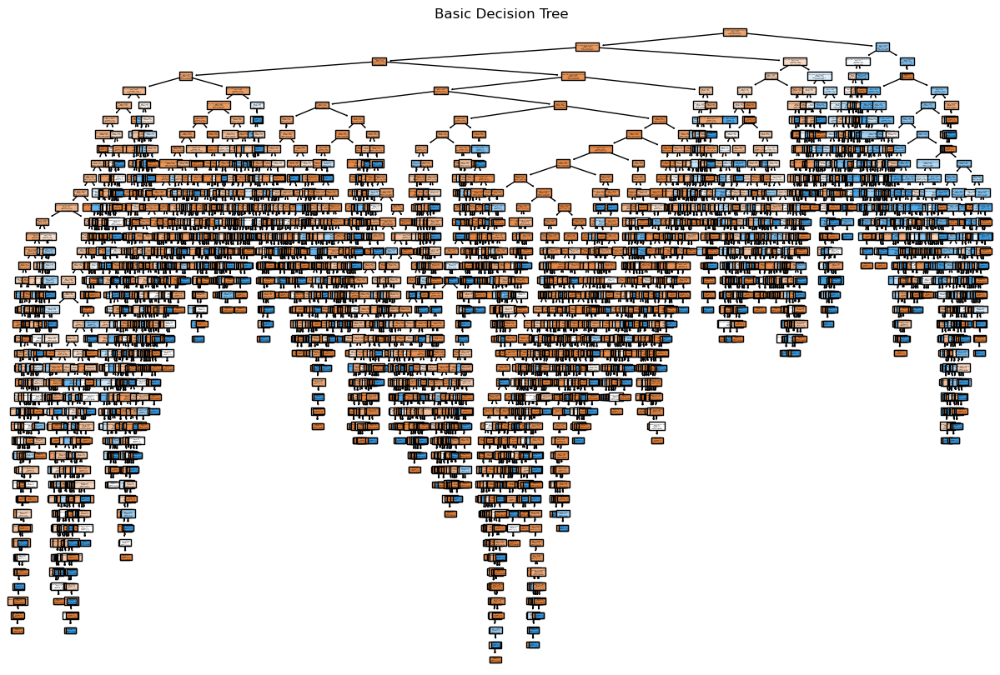

In [63]:
# Plot the basic decision tree
plt.figure(figsize=(15, 10))
plot_tree(basic_mer_model, feature_names=X_train.columns, class_names=["No Default", "Default"], filled=True)
plt.title("Basic Decision Tree")
plt.show()

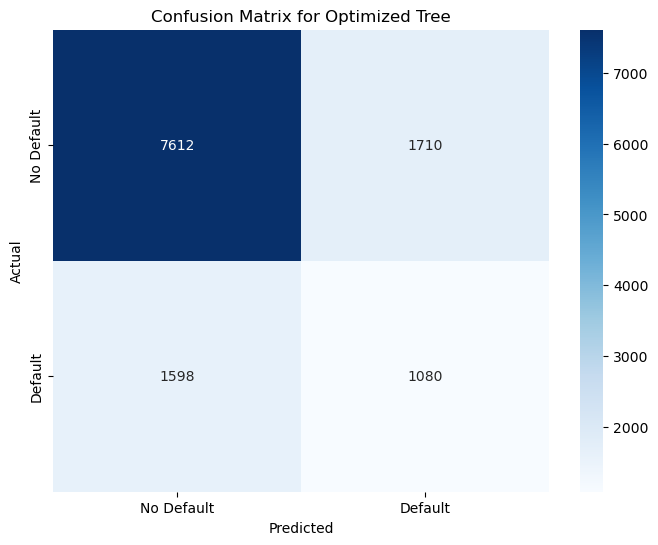

In [64]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix for Optimized Tree")
plt.show()

In [65]:
# Perform Grid Search for hyperparameter tuning
param_grid = {
    'max_depth': [2, 5, 10, 15, 20],
    'min_samples_split': [2, 5, 10, 20],
    'min_impurity_decrease': [0.0, 0.0005, 0.001, 0.005]
}
grid_search = GridSearchCV(DecisionTreeClassifier(random_state=1), param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1), n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10, 15, 20],
                         'min_impurity_decrease': [0.0, 0.0005, 0.001, 0.005],
                         'min_samples_split': [2, 5, 10, 20]})

In [66]:
# Best parameters from Grid Search
best_params = grid_search.best_params_
print("Best Parameters from Grid Search:", best_params)

Best Parameters from Grid Search: {'max_depth': 5, 'min_impurity_decrease': 0.0005, 'min_samples_split': 2}


Small Classification Tree with Control Parameters


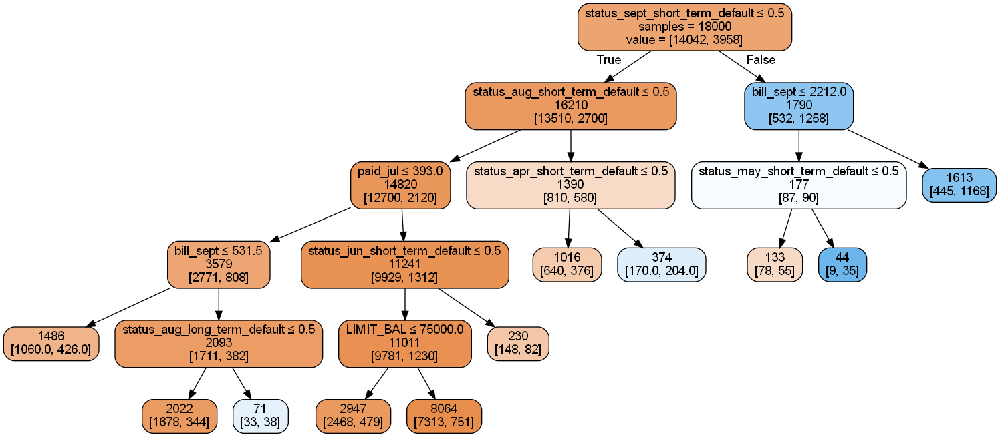

In [69]:
#implementing the result
best_Tree = DecisionTreeClassifier(max_depth=5, 
        min_impurity_decrease=0.0005, min_samples_split=2)
best_Tree.fit(X_train, y_train)

# Display classification tree for training partition.
print('Small Classification Tree with Control Parameters')
plotDecisionTree(best_Tree, feature_names=X_train.columns)

In [70]:
#checking for training data 
classificationSummary(y_train, best_Tree.predict(X_train))

Confusion Matrix (Accuracy 0.8239)

       Prediction
Actual     0     1
     0 13385   657
     1  2513  1445


In [71]:
classificationSummary(y_test, best_Tree.predict(X_test))

Confusion Matrix (Accuracy 0.8164)

       Prediction
Actual    0    1
     0 8850  472
     1 1731  947


In [76]:
#further trying random forrest
rf = RandomForestClassifier(n_estimators=700, random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=700, random_state=1)

In [77]:
classificationSummary(y_test, rf.predict(X_test))

Confusion Matrix (Accuracy 0.8136)

       Prediction
Actual    0    1
     0 8783  539
     1 1698  980


                           feature    importance       std
22  status_sept_short_term_default  8.486923e-02  0.036797
2                              AGE  6.606143e-02  0.004922
3                        bill_sept  6.288894e-02  0.005724
0                        LIMIT_BAL  6.032248e-02  0.005733
4                         bill_aug  5.564491e-02  0.005863
9                        paid_sept  5.417031e-02  0.008890
5                         bill_jul  5.322011e-02  0.005193
6                         bill_jun  5.240298e-02  0.005359
8                         bill_apr  5.218057e-02  0.004900
7                         bill_may  5.123865e-02  0.004944
10                        paid_aug  4.959842e-02  0.006305
14                        paid_apr  4.799723e-02  0.004789
11                        paid_jul  4.752108e-02  0.005550
12                        paid_jun  4.556609e-02  0.005229
13                        paid_may  4.536670e-02  0.004711
25   status_aug_short_term_default  3.860886e-02  0.0364

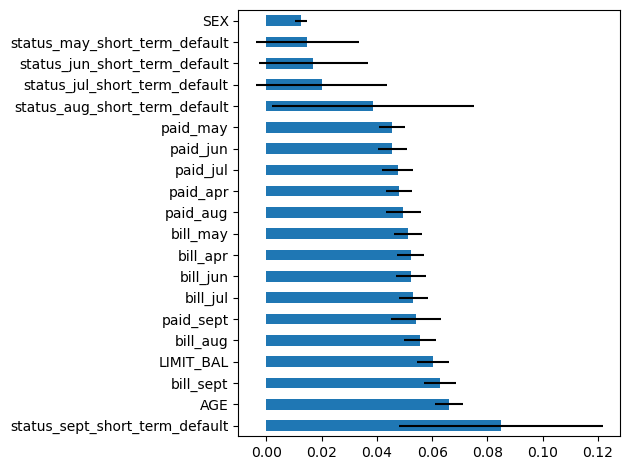

In [78]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance',ascending=False)
print(df)
# Select top 20 features
df_top20 = df.head(20)
#plt.figure(figsize=(12000, 100)) 
ax = df_top20.plot(kind='barh', xerr='std', x='feature', legend=False)

ax.set_ylabel('')
#plt.xticks(rotation=45) 
plt.tight_layout()
#plt.tight_layout(pad=20.0)
plt.show()

In [79]:
boost = GradientBoostingClassifier()
boost.fit(X_train, y_train)

GradientBoostingClassifier()

In [80]:
classificationSummary(y_test, boost.predict(X_test))

Confusion Matrix (Accuracy 0.8177)

       Prediction
Actual    0    1
     0 8873  449
     1 1738  940


In [ ]:
#logistic regression 

In [96]:
X=creditNorm.drop(columns=['default'])
y=creditNorm['default']

In [97]:
logit_reg = sm.GLM(y, X, family=sm.families.Binomial())

#Fit and print results

logit_reg.fit()
print(logit_reg.fit().summary())
print(y.head())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                default   No. Observations:                30000
Model:                            GLM   Df Residuals:                    29965
Model Family:                Binomial   Df Model:                           34
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13250.
Date:                Fri, 13 Dec 2024   Deviance:                       26500.
Time:                        13:08:17   Pearson chi2:                 3.11e+04
No. Iterations:                    19   Pseudo R-squ. (CS):             0.1593
Covariance Type:            nonrobust                                         
                                     coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
zLIMIT_BAL  

In [98]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

intercept  -1.8084082389119078
       zLIMIT_BAL      zAGE  zbill_sept  zbill_aug  zbill_jul  zbill_jun  \
coeff   -0.150989  0.057441   -0.099562   0.164962  -0.010695   0.105188   

       zbill_may  zbill_apr  zpaid_sept  zpaid_aug  ...  \
coeff  -0.128943   0.008443   -0.197723  -0.201862  ...   

       status_jul_first_time_default  status_jul_long_term_default  \
coeff                      -2.294231                      0.130063   

       status_jul_short_term_default  status_jun_first_time_default  \
coeff                       0.278578                            0.0   

       status_jun_long_term_default  status_jun_short_term_default  \
coeff                      0.135173                       0.287206   

       status_may_long_term_default  status_may_short_term_default  \
coeff                     -0.158112                       0.281558   

       status_apr_long_term_default  status_apr_short_term_default  
coeff                      0.483705                       0.25

In [99]:
logit_reg_pred = logit_reg.predict(valid_X)
logit_reg_proba = logit_reg.predict_proba(valid_X)
logit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in logit_reg_proba],
                             'p(1)': [p[1] for p in logit_reg_proba],
                             'predicted': logit_reg_pred })

In [100]:
classificationSummary(valid_y, logit_reg_pred)

Confusion Matrix (Accuracy 0.8167)

       Prediction
Actual    0    1
     0 8864  458
     1 1742  936


In [101]:
# Define a range of cutoffs
cutoff_range = np.arange(0.1, 0.8, 0.1)

# Initialize a dictionary to store results
confusion_matrices = {}

# Iterate through each cutoff
for cutoff in cutoff_range:
    # Generate predictions based on the current cutoff
    logit_reg_pred_custom = [1 if p[1] >= cutoff else 0 for p in logit_reg_proba]
    
    # Compute confusion matrix
    cm = confusion_matrix(valid_y, logit_reg_pred_custom)
    
    # Store the confusion matrix for the current cutoff
    confusion_matrices[cutoff] = cm

    # Print the classification summary for the current cutoff
    print(f"Cutoff: {cutoff}")
    classificationSummary(valid_y, logit_reg_pred_custom)
    print(f"Confusion Matrix:\n{cm}\n")

# You can now access confusion_matrices for analysis

Cutoff: 0.1
Confusion Matrix (Accuracy 0.3313)

       Prediction
Actual    0    1
     0 1405 7917
     1  107 2571
Confusion Matrix:
[[1405 7917]
 [ 107 2571]]

Cutoff: 0.2
Confusion Matrix (Accuracy 0.7718)

       Prediction
Actual    0    1
     0 7706 1616
     1 1122 1556
Confusion Matrix:
[[7706 1616]
 [1122 1556]]

Cutoff: 0.30000000000000004
Confusion Matrix (Accuracy 0.8090)

       Prediction
Actual    0    1
     0 8470  852
     1 1440 1238
Confusion Matrix:
[[8470  852]
 [1440 1238]]

Cutoff: 0.4
Confusion Matrix (Accuracy 0.8188)

       Prediction
Actual    0    1
     0 8764  558
     1 1616 1062
Confusion Matrix:
[[8764  558]
 [1616 1062]]

Cutoff: 0.5
Confusion Matrix (Accuracy 0.8167)

       Prediction
Actual    0    1
     0 8864  458
     1 1742  936
Confusion Matrix:
[[8864  458]
 [1742  936]]

Cutoff: 0.6
Confusion Matrix (Accuracy 0.8127)

       Prediction
Actual    0    1
     0 9027  295
     1 1953  725
Confusion Matrix:
[[9027  295]
 [1953  725]]

Cutoff

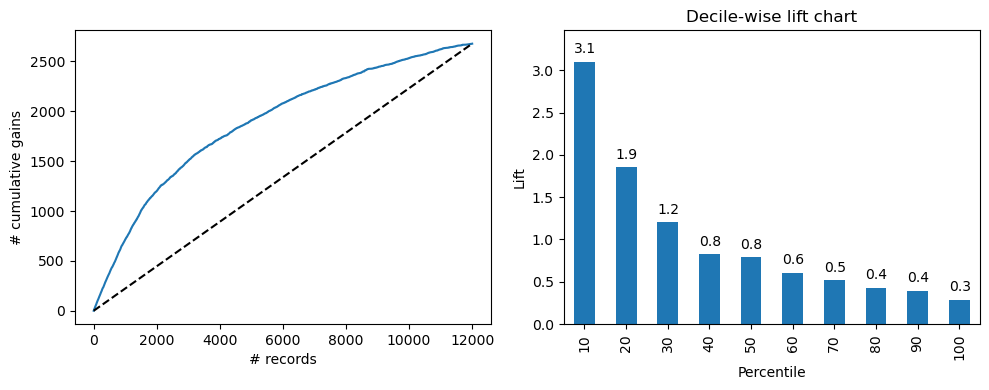

In [102]:
df = logit_result.sort_values(by=['p(1)'], ascending=False)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

gainsChart(df.actual, ax=axes[0])
liftChart(df.actual, title='Decile-wise lift chart', ax=axes[1])
    
plt.tight_layout()
plt.show()

In [ ]:
# model 3 


In [ ]:
# trees 


In [218]:
credit_v2.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'bill_sept', 'bill_aug',
       'bill_jul', 'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug',
       'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default.payment.next.month'],
      dtype='object')

In [219]:
def map_repayment_status(value):
    if value == -2:
        return 'overpaid'
    elif value == -1:
        return 'on_time'
    elif value == 0:
        return 'neutral'
    elif value == 1:
        return '1_month_default'
    elif value in [2,3]:
        return 'short_default'
    elif value in [4, 5]:
        return 'medium_default'
    else:  # 6, 7, 8, 9
        return 'severe_default'


In [220]:
# # Define a function to map repayment status
# def map_repayment_status(value):
#     if value in [-2, -1, 0]:
#         return 'no_issue'
#     elif value == 1:
#         return 'first_time_default'
#     elif value in [2, 3]:
#         return 'short_term_default'
#     else:
#         return 'long_term_default'

# Apply mapping to all PAY_* columns
pay_columns = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
for col in pay_columns:
    credit_v2[col] = credit_v2[col].apply(map_repayment_status)

# Check the unique values after transformation
for col in pay_columns:
    print(f"Unique values in '{col}': {credit_v2[col].unique()}")


Unique values in 'PAY_0': ['short_default' 'on_time' 'neutral' 'overpaid' '1_month_default'
 'medium_default' 'severe_default']
Unique values in 'PAY_2': ['short_default' 'neutral' 'on_time' 'overpaid' 'medium_default'
 'severe_default' '1_month_default']
Unique values in 'PAY_3': ['on_time' 'neutral' 'short_default' 'overpaid' 'medium_default'
 'severe_default' '1_month_default']
Unique values in 'PAY_4': ['on_time' 'neutral' 'overpaid' 'short_default' 'medium_default'
 'severe_default' '1_month_default']
Unique values in 'PAY_5': ['overpaid' 'neutral' 'on_time' 'short_default' 'medium_default'
 'severe_default']
Unique values in 'PAY_6': ['overpaid' 'short_default' 'neutral' 'on_time' 'medium_default'
 'severe_default']


In [221]:
credit_v2.rename(columns={
    "default.payment.next.month": "default", 
    'PAY_0': 'status_sept', 
    'PAY_2': 'status_aug', 
    'PAY_3': 'status_jul', 
    'PAY_4': 'status_jun', 
    'PAY_5': 'status_may', 
    'PAY_6': 'status_apr'
}, inplace=True)

# Print the updated column names
credit_v2.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'status_sept',
       'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr',
       'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun', 'bill_may', 'bill_apr',
       'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun', 'paid_may', 'paid_apr',
       'default'],
      dtype='object')

In [222]:
# List of columns to convert
categorical_columns = ['EDUCATION', 'MARRIAGE', 
                       'status_sept', 'status_aug', 'status_jul', 
                       'status_jun', 'status_may', 'status_apr']

# Convert columns to category type
credit_v2[categorical_columns] = credit_v2[categorical_columns].astype('category')

# Verify the changes
print(credit_v2.dtypes)


ID                int64
LIMIT_BAL       float64
SEX               int64
EDUCATION      category
MARRIAGE       category
AGE               int64
status_sept    category
status_aug     category
status_jul     category
status_jun     category
status_may     category
status_apr     category
bill_sept       float64
bill_aug        float64
bill_jul        float64
bill_jun        float64
bill_may        float64
bill_apr        float64
paid_sept       float64
paid_aug        float64
paid_jul        float64
paid_jun        float64
paid_may        float64
paid_apr        float64
default           int64
dtype: object


In [223]:
# Select the categorical columns to one-hot encode
categorical_columns = ['EDUCATION', 'MARRIAGE', 'status_sept', 'status_aug', 'status_jul', 'status_jun', 'status_may', 'status_apr']

# One-hot encode only the selected columns
credit_v2 = pd.get_dummies(credit_v2, columns=categorical_columns, prefix_sep='_', drop_first=True)

# # Drop the 'no_issue' category (if it exists)
# credit_merge = credit_merge.loc[:, ~credit_merge.columns.str.contains('no_issue')]

# Check the resulting columns
print(credit_v2.columns)


Index(['ID', 'LIMIT_BAL', 'SEX', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default', 'EDUCATION_High school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_

In [224]:
# Replace spaces with underscores in column names
credit_v2.columns = credit_v2.columns.str.replace(' ', '_')

# Check the updated column names
print(credit_v2.columns)


Index(['ID', 'LIMIT_BAL', 'SEX', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default', 'EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_

In [225]:
credit_v2.head()

,ID,LIMIT_BAL,SEX,AGE,bill_sept,bill_aug,bill_jul,bill_jun,bill_may,bill_apr,...,status_may_neutral,status_may_on_time,status_may_overpaid,status_may_severe_default,status_may_short_default,status_apr_neutral,status_apr_on_time,status_apr_overpaid,status_apr_severe_default,status_apr_short_default
0,1,20000.0,0,24,3913.0,3102.0,689.0,0.0,0.0,0.0,...,False,False,True,False,False,False,False,True,False,False
1,2,120000.0,0,26,2682.0,1725.0,2682.0,3272.0,3455.0,3261.0,...,True,False,False,False,False,False,False,False,False,True
2,3,90000.0,0,34,29239.0,14027.0,13559.0,14331.0,14948.0,15549.0,...,True,False,False,False,False,True,False,False,False,False
3,4,50000.0,0,37,46990.0,48233.0,49291.0,28314.0,28959.0,29547.0,...,True,False,False,False,False,True,False,False,False,False
4,5,50000.0,1,57,8617.0,5670.0,35835.0,20940.0,19146.0,19131.0,...,True,False,False,False,False,True,False,False,False,False


In [226]:
# Convert the True/False columns to 1/0
credit_v2 = credit_v2.astype({col: 'int' for col in credit_v2.select_dtypes(include=['bool']).columns})

# Check the data types to confirm the change
print(credit_v2.dtypes)

ID                              int64
LIMIT_BAL                     float64
SEX                             int64
AGE                             int64
bill_sept                     float64
bill_aug                      float64
bill_jul                      float64
bill_jun                      float64
bill_may                      float64
bill_apr                      float64
paid_sept                     float64
paid_aug                      float64
paid_jul                      float64
paid_jun                      float64
paid_may                      float64
paid_apr                      float64
default                         int64
EDUCATION_High_school           int32
EDUCATION_Others                int32
EDUCATION_University            int32
MARRIAGE_Others                 int32
MARRIAGE_Single                 int32
status_sept_medium_default      int32
status_sept_neutral             int32
status_sept_on_time             int32
status_sept_overpaid            int32
status_sept_

In [227]:
# Drop the 'ID' column
credit_v2 = credit_v2.drop(columns=['ID'])

# Verify the change
print(credit_v2.head())

   LIMIT_BAL  SEX  AGE  bill_sept  bill_aug  bill_jul  bill_jun  bill_may  \
0    20000.0    0   24     3913.0    3102.0     689.0       0.0       0.0   
1   120000.0    0   26     2682.0    1725.0    2682.0    3272.0    3455.0   
2    90000.0    0   34    29239.0   14027.0   13559.0   14331.0   14948.0   
3    50000.0    0   37    46990.0   48233.0   49291.0   28314.0   28959.0   
4    50000.0    1   57     8617.0    5670.0   35835.0   20940.0   19146.0   

   bill_apr  paid_sept  ...  status_may_neutral  status_may_on_time  \
0       0.0        0.0  ...                   0                   0   
1    3261.0        0.0  ...                   1                   0   
2   15549.0     1518.0  ...                   1                   0   
3   29547.0     2000.0  ...                   1                   0   
4   19131.0     2000.0  ...                   1                   0   

   status_may_overpaid  status_may_severe_default  status_may_short_default  \
0                    1         

In [229]:
#,partition
#Separate X and y variables
X = credit_v2.drop(columns=['default'])  # Remove irrelevant columns
y = credit_v2['default']

In [230]:
#data split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=1)

In [231]:
dt_model = DecisionTreeClassifier(random_state=1)
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

In [232]:
y_pred = dt_model.predict(X_test)

In [233]:
accuracy = accuracy_score(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

In [234]:
print(classification_rep)

              precision    recall  f1-score   support

           0       0.83      0.81      0.82      9322
           1       0.38      0.41      0.40      2678

    accuracy                           0.72     12000
   macro avg       0.60      0.61      0.61     12000
weighted avg       0.73      0.72      0.72     12000



In [235]:
#Develop trees
classificationSummary(y_train, dt_model.predict(X_train))
plotDecisionTree(dt_model, feature_names=X_train.columns)

Confusion Matrix (Accuracy 0.9994)

       Prediction
Actual     0     1
     0 14041     1
     1    10  3948


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.373609 to fit


In [236]:
classificationSummary(y_test, dt_model.predict(X_test))

Confusion Matrix (Accuracy 0.7204)

       Prediction
Actual    0    1
     0 7546 1776
     1 1579 1099


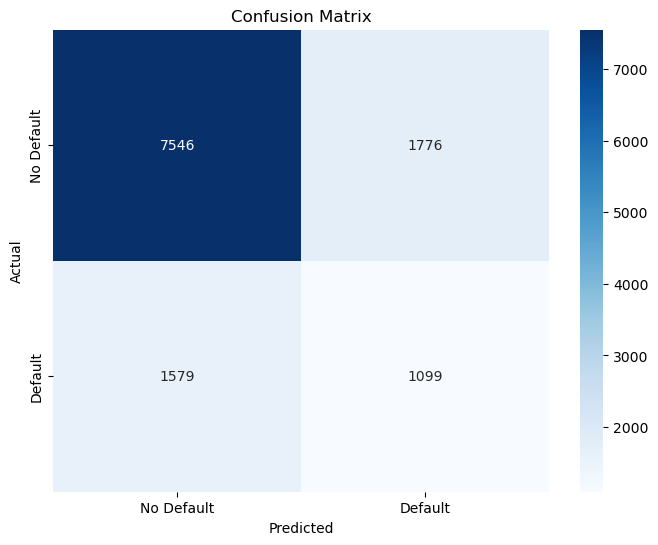

In [237]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Generate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [238]:
# Start with an initial guess for parameters
param_grid = {
    'max_depth': [10, 20, 30, 40], 
    'min_samples_split': [20, 40, 60, 80, 100], 
    'min_impurity_decrease': [0, 0.0005, 0.001, 0.005, 0.01], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1) #n_jobs=-1 means 
        #that the availalbe computer memory (CPU) will be used to make calculations faster. 
gridSearch.fit(X_train, y_train)
print('Initial score: ', gridSearch.best_score_)
print('Initial parameters: ', gridSearch.best_params_)

Initial score:  0.8217777777777778
Initial parameters:  {'max_depth': 10, 'min_impurity_decrease': 0.001, 'min_samples_split': 20}


In [239]:
# Adapt grid based on result from initial grid search
param_grid = {
    'max_depth': list(range(2, 16)), 
    'min_samples_split': list(range(15, 25)), 
    'min_impurity_decrease': [0.0009,0.0001,0.0005, 0.0004, 0.0006], 
}
gridSearch = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5, n_jobs=-1)
gridSearch.fit(X_train, y_train)
print('Improved score: ', gridSearch.best_score_)
print('Improved parameters: ', gridSearch.best_params_)

bestClassTree = gridSearch.best_estimator_

Improved score:  0.8220555555555557
Improved parameters:  {'max_depth': 5, 'min_impurity_decrease': 0.0004, 'min_samples_split': 15}


Confusion Matrix (Accuracy 0.8163)

       Prediction
Actual    0    1
     0 8823  499
     1 1706  972


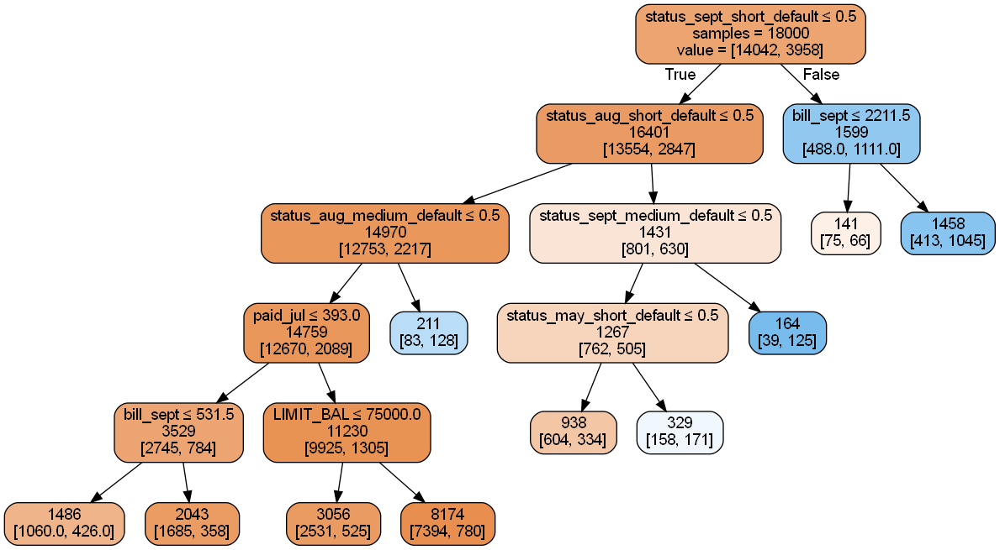

In [241]:
bestClassTree = DecisionTreeClassifier(max_depth=5, 
        min_impurity_decrease=0.0004, min_samples_split=15)
bestClassTree.fit(X_train, y_train)
classificationSummary(y_test, bestClassTree.predict(X_test))
plotDecisionTree(bestClassTree, feature_names=X_train.columns)

In [242]:
rf = RandomForestClassifier(n_estimators=500, random_state=1)
rf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=500, random_state=1)

                       feature  importance       std
36   status_jul_severe_default    0.000185  0.000435
24  status_sept_severe_default    0.000185  0.000413
30   status_aug_severe_default    0.000213  0.000488
42   status_jun_severe_default    0.000265  0.000586
47   status_may_severe_default    0.000348  0.000783
52   status_apr_severe_default    0.000377  0.000644
32   status_jul_medium_default    0.001423  0.001338
16            EDUCATION_Others    0.001562  0.000717
38   status_jun_medium_default    0.001632  0.001490
46         status_may_overpaid    0.001822  0.000839
29         status_aug_overpaid    0.001990  0.002652
35         status_jul_overpaid    0.002028  0.003082
41         status_jun_overpaid    0.002108  0.002243
18             MARRIAGE_Others    0.002139  0.000841
51         status_apr_overpaid    0.002623  0.001188
40          status_jun_on_time    0.003393  0.002413
45          status_may_on_time    0.003485  0.001534
34          status_jul_on_time    0.003775  0.

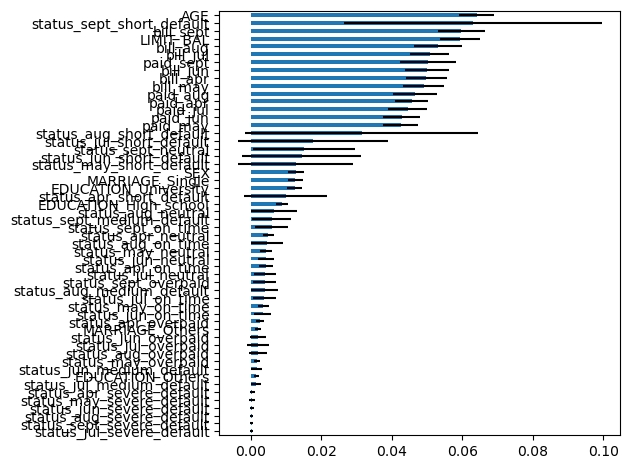

In [243]:
importances = rf.feature_importances_
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

df = pd.DataFrame({'feature': X_train.columns, 'importance': importances, 'std': std})
df = df.sort_values('importance')
print(df)

ax = df.plot(kind='barh', xerr='std', x='feature', legend=False)
ax.set_ylabel('')

plt.tight_layout()
plt.show()

In [244]:
classificationSummary(y_test, rf.predict(X_test))

Confusion Matrix (Accuracy 0.8141)

       Prediction
Actual    0    1
     0 8768  554
     1 1677 1001


In [245]:
boost = GradientBoostingClassifier()
boost.fit(X_train, y_train)

GradientBoostingClassifier()

In [246]:
classificationSummary(y_test, boost.predict(X_test))

Confusion Matrix (Accuracy 0.8178)

       Prediction
Actual    0    1
     0 8856  466
     1 1720  958


In [247]:
#KNN MODEL 2 

In [248]:
# random_state is set to a defined value to get the same partitions when re-running the code
trainData= credit_v2.sample(frac=0.6, random_state=1)
# assign rows that are not already in the training set, into validation 
validData = credit_v2.drop(trainData.index)

print('Training   : ', trainData.shape)
print('Validation : ', validData.shape)
print()

Training   :  (18000, 55)
Validation :  (12000, 55)



In [250]:
trainData.columns

Index(['LIMIT_BAL', 'SEX', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul',
       'bill_jun', 'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul',
       'paid_jun', 'paid_may', 'paid_apr', 'default', 'EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_sh

In [252]:
scaler = preprocessing.StandardScaler()
scaler.fit(trainData[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']])  # Note the use of an array of column names

# Transform the full dataset
creditNorm = pd.concat([pd.DataFrame(scaler.transform(credit_v2[['LIMIT_BAL', 'AGE', 'bill_sept', 'bill_aug', 'bill_jul', 'bill_jun',
       'bill_may', 'bill_apr', 'paid_sept', 'paid_aug', 'paid_jul', 'paid_jun',
       'paid_may', 'paid_apr']]), 
                                    columns=['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr']),
                       credit_v2[['default', 'EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']]], axis=1)
trainNorm = creditNorm.iloc[trainData.index]



In [259]:
validNorm = creditNorm.iloc[validData.index]
validNorm.head()

,zLIMIT_BAL,zAGE,zbill_sept,zbill_aug,zbill_jul,zbill_jun,zbill_may,zbill_apr,zpaid_sept,zpaid_aug,...,status_may_neutral,status_may_on_time,status_may_overpaid,status_may_severe_default,status_may_short_default,status_apr_neutral,status_apr_on_time,status_apr_overpaid,status_apr_severe_default,status_apr_short_default
1,-0.365646,-1.026086,-0.662435,-0.670024,-0.635903,-0.622856,-0.610225,-0.601873,-0.337390,-0.203918,...,1,0,0,0,0,0,0,0,0,1
9,-1.136671,-0.054005,-0.698555,-0.694029,-0.673762,-0.673172,-0.454418,-0.424575,-0.337390,-0.245363,...,0,1,0,0,0,0,1,0,0,0
10,0.251173,-0.162014,-0.549428,-0.557833,-0.595630,-0.634528,-0.636763,-0.594050,-0.200920,-0.244866,...,1,0,0,0,0,0,1,0,0,0
14,0.636685,-0.702059,0.256123,0.239179,0.223463,0.244819,0.261134,0.267904,-0.159849,-0.121028,...,1,0,0,0,0,1,0,0,0,0
15,-0.905364,-1.350113,-0.016906,-0.288057,-0.276877,-0.230739,-0.184887,-0.153260,-0.337390,-0.183196,...,1,0,0,0,0,1,0,0,0,0


In [257]:
knn_v2 = KNeighborsClassifier(n_neighbors=3).fit(trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']], trainNorm['default'])


In [260]:
valid_pred=knn_v2.predict(validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']])

In [261]:
accuracy_score(validNorm['default'], valid_pred)

0.7755833333333333

In [262]:
#knn best K 
train_X = trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']]
train_y = trainNorm['default']
valid_X = validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']]
valid_y = validNorm['default']
results = []
max_accuracy = 0  # Initialize max accuracy variable
best_k = 0  # Initialize best k value

for k in range(1, 40):
    knn = KNeighborsClassifier(n_neighbors=k).fit(train_X, train_y)
    accuracy = accuracy_score(valid_y, knn.predict(valid_X))
    results.append({
        'k': k,
        'accuracy': accuracy
    })
    
    # Update max accuracy and best k value
    if accuracy > max_accuracy:
        max_accuracy = accuracy
        best_k = k

# Convert results to a pandas DataFrame
results = pd.DataFrame(results)

# Print the results and the best k value
print(results)
print(f"Max Accuracy: {max_accuracy} at k = {best_k}")

     k  accuracy
0    1  0.728667
1    2  0.786750
2    3  0.775583
3    4  0.796417
4    5  0.793000
5    6  0.803167
6    7  0.804167
7    8  0.811167
8    9  0.810333
9   10  0.812833
10  11  0.812667
11  12  0.812917
12  13  0.814000
13  14  0.815167
14  15  0.816083
15  16  0.815667
16  17  0.814417
17  18  0.814833
18  19  0.814750
19  20  0.814583
20  21  0.814833
21  22  0.814583
22  23  0.815250
23  24  0.815417
24  25  0.815833
25  26  0.817667
26  27  0.816750
27  28  0.816667
28  29  0.816917
29  30  0.816167
30  31  0.816917
31  32  0.816500
32  33  0.816000
33  34  0.815750
34  35  0.815750
35  36  0.815417
36  37  0.815750
37  38  0.815917
38  39  0.815833
Max Accuracy: 0.8176666666666667 at k = 26


In [263]:
knn_bestk= KNeighborsClassifier(n_neighbors=26).fit(trainNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']], trainNorm['default'])


In [264]:
valid_predk=knn_bestk.predict(validNorm[['zLIMIT_BAL','zAGE', 'zbill_sept', 'zbill_aug', 'zbill_jul', 'zbill_jun',
       'zbill_may', 'zbill_apr', 'zpaid_sept', 'zpaid_aug', 'zpaid_jul', 'zpaid_jun',
       'zpaid_may', 'zpaid_apr','EDUCATION_High_school',
       'EDUCATION_Others', 'EDUCATION_University', 'MARRIAGE_Others',
       'MARRIAGE_Single', 'status_sept_medium_default', 'status_sept_neutral',
       'status_sept_on_time', 'status_sept_overpaid',
       'status_sept_severe_default', 'status_sept_short_default',
       'status_aug_medium_default', 'status_aug_neutral', 'status_aug_on_time',
       'status_aug_overpaid', 'status_aug_severe_default',
       'status_aug_short_default', 'status_jul_medium_default',
       'status_jul_neutral', 'status_jul_on_time', 'status_jul_overpaid',
       'status_jul_severe_default', 'status_jul_short_default',
       'status_jun_medium_default', 'status_jun_neutral', 'status_jun_on_time',
       'status_jun_overpaid', 'status_jun_severe_default',
       'status_jun_short_default', 'status_may_neutral', 'status_may_on_time',
       'status_may_overpaid', 'status_may_severe_default',
       'status_may_short_default', 'status_apr_neutral', 'status_apr_on_time',
       'status_apr_overpaid', 'status_apr_severe_default',
       'status_apr_short_default']])

In [265]:
accuracy_score(validNorm['default'], valid_predk)

0.8176666666666667

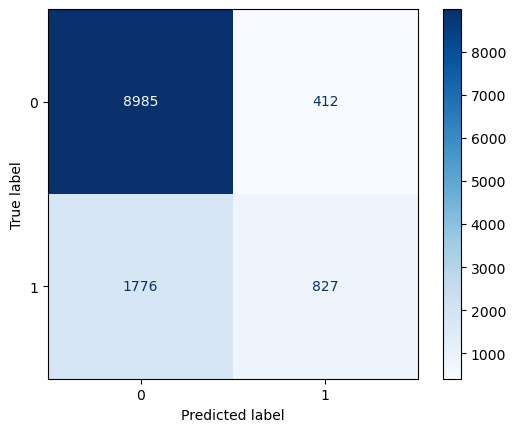

In [267]:
cm_full_VALID= confusion_matrix(validNorm['default'] ,valid_predk)
cm_display_fullVALID= ConfusionMatrixDisplay(confusion_matrix=cm_full_VALID, display_labels=knn_bestk.classes_)
cm_display_fullVALID.plot(cmap='Blues')

In [ ]:
#logistic regression 

In [268]:
X=creditNorm.drop(columns=['default'])
y=creditNorm['default']

In [269]:
logit_reg = sm.GLM(y, X, family=sm.families.Binomial())

#Fit and print results

logit_reg.fit()
print(logit_reg.fit().summary())
print(y.head())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                default   No. Observations:                30000
Model:                            GLM   Df Residuals:                    29947
Model Family:                Binomial   Df Model:                           52
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13037.
Date:                Fri, 13 Dec 2024   Deviance:                       26074.
Time:                        18:26:47   Pearson chi2:                 3.10e+04
No. Iterations:                    20   Pseudo R-squ. (CS):             0.1711
Covariance Type:            nonrobust                                         
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
zLIMIT_BAL          

In [270]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

intercept  -2.045528445980016
       zLIMIT_BAL      zAGE  zbill_sept  zbill_aug  zbill_jul  zbill_jun  \
coeff   -0.227769  0.051867   -0.017906   0.174656   -0.02887   0.112979   

       zbill_may  zbill_apr  zpaid_sept  zpaid_aug  ...  status_may_neutral  \
coeff  -0.136081   0.048542   -0.193679    -0.2038  ...           -0.035284   

       status_may_on_time  status_may_overpaid  status_may_severe_default  \
coeff           -0.204731              0.04716                   4.519153   

       status_may_short_default  status_apr_neutral  status_apr_on_time  \
coeff                  0.234094           -0.737346           -0.557189   

       status_apr_overpaid  status_apr_severe_default  \
coeff            -0.493477                   0.212186   

       status_apr_short_default  
coeff                 -0.435857  

[1 rows x 53 columns]

AIC 13725.034942026781


In [271]:
# partition data
train_X, valid_X, train_y, valid_y = train_test_split(X, y, test_size=0.4, random_state=1)

# fit a logistic regression (set penalty=l2 (a penalty of L2 will force some coefficients to be small, 
#essentially focusing on a fewer variables) and C=1e42 avoids regularization, C denotes how strong we want 
#regularization to be. A smaller C will make regularization stronger )
logit_reg = LogisticRegression(penalty="l2", C=1e42, solver='liblinear')
logit_reg.fit(train_X, train_y)

#Get intercepts, coefficients, and AIC
print('intercept ', logit_reg.intercept_[0])
print(pd.DataFrame({'coeff': logit_reg.coef_[0]}, index=X.columns).transpose())
print() #Creates a Line space
print('AIC', AIC_score(valid_y, logit_reg.predict(valid_X), df = len(train_X.columns) + 1))

intercept  -2.045528445980016
       zLIMIT_BAL      zAGE  zbill_sept  zbill_aug  zbill_jul  zbill_jun  \
coeff   -0.227769  0.051867   -0.017906   0.174656   -0.02887   0.112979   

       zbill_may  zbill_apr  zpaid_sept  zpaid_aug  ...  status_may_neutral  \
coeff  -0.136081   0.048542   -0.193679    -0.2038  ...           -0.035284   

       status_may_on_time  status_may_overpaid  status_may_severe_default  \
coeff           -0.204731              0.04716                   4.519153   

       status_may_short_default  status_apr_neutral  status_apr_on_time  \
coeff                  0.234094           -0.737346           -0.557189   

       status_apr_overpaid  status_apr_severe_default  \
coeff            -0.493477                   0.212186   

       status_apr_short_default  
coeff                 -0.435857  

[1 rows x 53 columns]

AIC 13725.034942026781


In [272]:
logit_reg_pred = logit_reg.predict(valid_X)
logit_reg_proba = logit_reg.predict_proba(valid_X)
logit_result = pd.DataFrame({'actual': valid_y, 
                             'p(0)': [p[0] for p in logit_reg_proba],
                             'p(1)': [p[1] for p in logit_reg_proba],
                             'predicted': logit_reg_pred })

In [273]:
classificationSummary(valid_y, logit_reg_pred)

Confusion Matrix (Accuracy 0.8179)

       Prediction
Actual    0    1
     0 8875  447
     1 1738  940


In [274]:
# Define a range of cutoffs
cutoff_range = np.arange(0.1, 0.8, 0.1)

# Initialize a dictionary to store results
confusion_matrices = {}

# Iterate through each cutoff
for cutoff in cutoff_range:
    # Generate predictions based on the current cutoff
    logit_reg_pred_custom = [1 if p[1] >= cutoff else 0 for p in logit_reg_proba]
    
    # Compute confusion matrix
    cm = confusion_matrix(valid_y, logit_reg_pred_custom)
    
    # Store the confusion matrix for the current cutoff
    confusion_matrices[cutoff] = cm

    # Print the classification summary for the current cutoff
    print(f"Cutoff: {cutoff}")
    classificationSummary(valid_y, logit_reg_pred_custom)
    print(f"Confusion Matrix:\n{cm}\n")

# You can now access confusion_matrices for analysis

Cutoff: 0.1
Confusion Matrix (Accuracy 0.3690)

       Prediction
Actual    0    1
     0 1875 7447
     1  125 2553
Confusion Matrix:
[[1875 7447]
 [ 125 2553]]

Cutoff: 0.2
Confusion Matrix (Accuracy 0.7608)

       Prediction
Actual    0    1
     0 7520 1802
     1 1069 1609
Confusion Matrix:
[[7520 1802]
 [1069 1609]]

Cutoff: 0.30000000000000004
Confusion Matrix (Accuracy 0.8021)

       Prediction
Actual    0    1
     0 8333  989
     1 1386 1292
Confusion Matrix:
[[8333  989]
 [1386 1292]]

Cutoff: 0.4
Confusion Matrix (Accuracy 0.8182)

       Prediction
Actual    0    1
     0 8746  576
     1 1606 1072
Confusion Matrix:
[[8746  576]
 [1606 1072]]

Cutoff: 0.5
Confusion Matrix (Accuracy 0.8179)

       Prediction
Actual    0    1
     0 8875  447
     1 1738  940
Confusion Matrix:
[[8875  447]
 [1738  940]]

Cutoff: 0.6
Confusion Matrix (Accuracy 0.8133)

       Prediction
Actual    0    1
     0 9007  315
     1 1926  752
Confusion Matrix:
[[9007  315]
 [1926  752]]

Cutoff

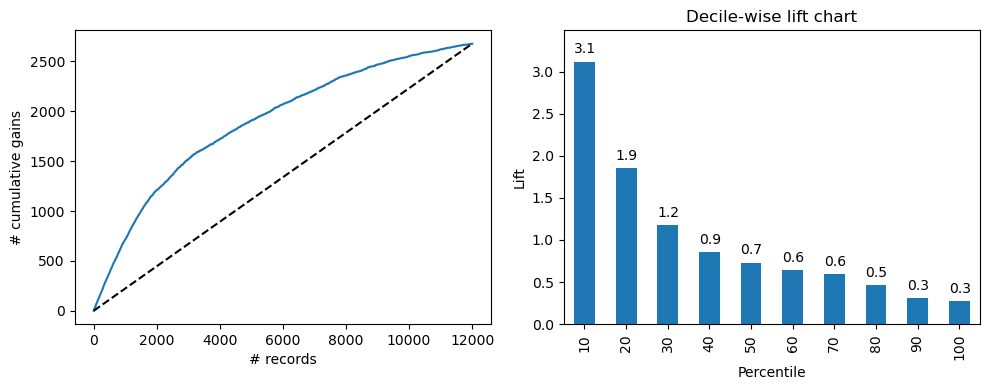

In [275]:
df = logit_result.sort_values(by=['p(1)'], ascending=False)
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

gainsChart(df.actual, ax=axes[0])
liftChart(df.actual, title='Decile-wise lift chart', ax=axes[1])
    
plt.tight_layout()
plt.show()

In [550]:
import pandas as pd


# Categorize LIMIT_BAL into "Low", "Medium", "High"
credit_df['LIMIT_BAL_Category'] = pd.cut(
    credit_df['LIMIT_BAL'],
    bins=[0, 100000, 300000, credit_df['LIMIT_BAL'].max()],
    labels=['Low', 'Medium', 'High'],
    right=False
)

# Display some lines to verify the categorization
print(credit_df[['LIMIT_BAL', 'LIMIT_BAL_Category']].head())


   LIMIT_BAL LIMIT_BAL_Category
0    20000.0                Low
1   120000.0             Medium
2    90000.0                Low
3    50000.0                Low
4    50000.0                Low


In [558]:

# Calculate default rates for each category
default_rate_summary = credit_df.groupby('LIMIT_BAL_Category')['default'].mean() * 100

# Display default rates as percentages
print("Default Rates by Credit Limit Category (in %):")
print(default_rate_summary)


Default Rates by Credit Limit Category (in %):
LIMIT_BAL_Category
Low       29.799127
Medium    18.789548
High      13.682565
Name: default, dtype: float64


/var/folders/jh/mp1rq7qd22lbglyqfp98ctr40000gn/T/ipykernel_19453/693844813.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  default_rate_summary = credit_df.groupby('LIMIT_BAL_Category')['default'].mean() * 100


/var/folders/jh/mp1rq7qd22lbglyqfp98ctr40000gn/T/ipykernel_19453/3230676325.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  default_summary = credit_df.groupby('LIMIT_BAL_Category')['default'].mean().reset_index()
/var/folders/jh/mp1rq7qd22lbglyqfp98ctr40000gn/T/ipykernel_19453/3230676325.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='LIMIT_BAL_Category', y='default', data=default_summary, palette='viridis')


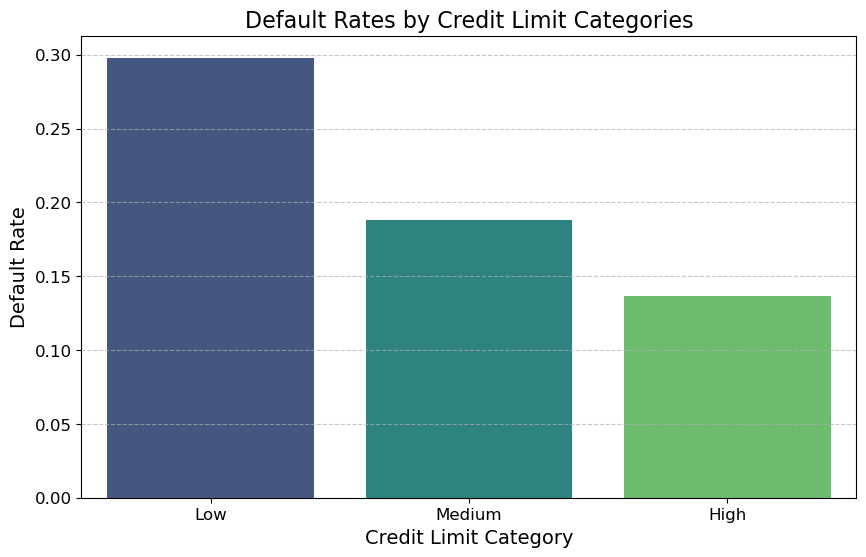

In [560]:

# Summarize the default rates by LIMIT_BAL_Category
default_summary = credit_df.groupby('LIMIT_BAL_Category')['default'].mean().reset_index()

# Visualization of default rates by LIMIT_BAL_Category
plt.figure(figsize=(10, 6))
sns.barplot(x='LIMIT_BAL_Category', y='default', data=default_summary, palette='viridis')
plt.title('Default Rates by Credit Limit Categories', fontsize=16)
plt.xlabel('Credit Limit Category', fontsize=14)
plt.ylabel('Default Rate', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [562]:
# Count of defaults and non-defaults for each category
default_count_summary = credit_df.groupby(['LIMIT_BAL_Category', 'default']).size().unstack()

# Display the counts
print("\nDefault and Non-Default Counts by Credit Limit Category:")
print(default_count_summary)

# Add totals for each category for better understanding
default_count_summary['Total'] = default_count_summary.sum(axis=1)
print("\nDefault Counts with Totals:")
print(default_count_summary)



Default and Non-Default Counts by Credit Limit Category:
default                 0     1
LIMIT_BAL_Category             
Low                  8038  3412
Medium              10909  2524
High                 4416   700

Default Counts with Totals:
default                 0     1  Total
LIMIT_BAL_Category                    
Low                  8038  3412  11450
Medium              10909  2524  13433
High                 4416   700   5116


/var/folders/jh/mp1rq7qd22lbglyqfp98ctr40000gn/T/ipykernel_19453/2062697957.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  default_count_summary = credit_df.groupby(['LIMIT_BAL_Category', 'default']).size().unstack()


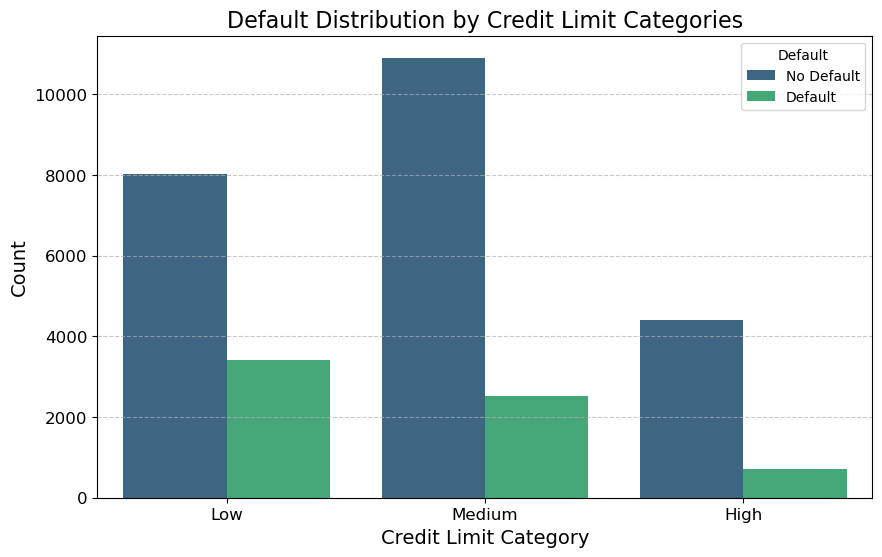

In [554]:
# Visualization of default count distribution by LIMIT_BAL_Category
plt.figure(figsize=(10, 6))
sns.countplot(x='LIMIT_BAL_Category', hue='default', data=credit_df, palette='viridis')
plt.title('Default Distribution by Credit Limit Categories', fontsize=16)
plt.xlabel('Credit Limit Category', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.legend(title='Default', loc='upper right', labels=['No Default', 'Default'])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [157]:
credit_df.groupby(['SEX', 'default']).size()

SEX     default
Female  0          14349
        1           3763
Male    0           9015
        1           2873
dtype: int64

In [159]:
#Default payment (1=yes, 0=no)

In [161]:
gender=pd.crosstab(credit_df.SEX, credit_df.default) #1 is male and 2 is female
gender

default,0,1
SEX,,
Female,14349,3763
Male,9015,2873


The size of the female population is more than that of male and also the default number is also huge in female. But it is important to consider the percentage of default.

<Axes: xlabel='SEX'>

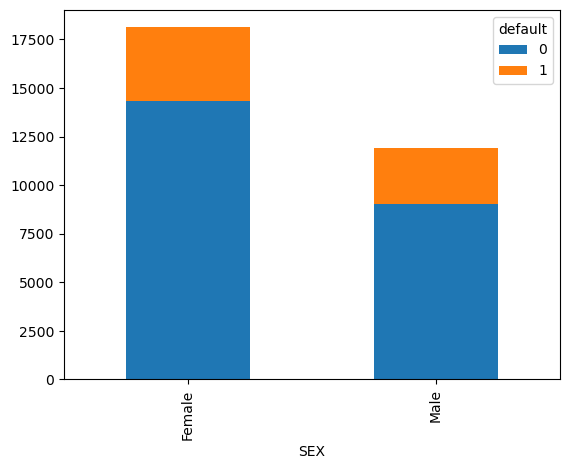

In [164]:
gender.plot(kind='bar', stacked = True)

In [166]:
gender['percentage'] = (gender[1]/(gender[0] + gender[1])) 
#this creates a new column in our dataset
gender

default,0,1,percentage
SEX,,,
Female,14349,3763,0.207763
Male,9015,2873,0.241672


In [135]:
pd.crosstab(credit_df.MARRIAGE, credit_df.default) # 1=married, 2=single, 3=others

default,0,1
MARRIAGE,,
1,10453,3206
2,12623,3341
3,288,89


In [137]:
pd.crosstab(credit_df.EDUCATION, credit_df.default) #1=graduate school, 2=university, 3=high school, 4=others

default,0,1
EDUCATION,,
1,8549,2036
2,10700,3330
3,3680,1237
4,435,33


/var/folders/jh/mp1rq7qd22lbglyqfp98ctr40000gn/T/ipykernel_55264/2919438670.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=default_counts, x='default', y='count', palette='coolwarm')


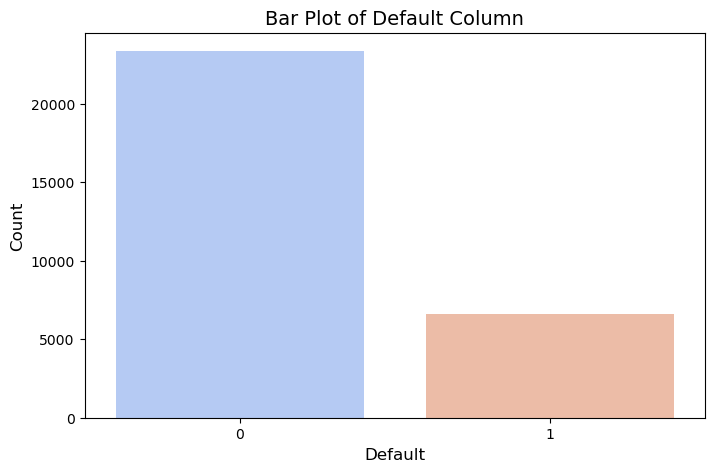

In [17]:
# Count of each unique value in the 'default' column
default_counts = credit_df['default'].value_counts().reset_index()
default_counts.columns = ['default', 'count']

# Create the bar plot
plt.figure(figsize=(8, 5))
sns.barplot(data=default_counts, x='default', y='count', palette='coolwarm')

# Add labels and title
plt.xlabel('Default', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Bar Plot of Default Column', fontsize=14)

# Show the plot
plt.show()



In [19]:
# Count of each unique value in the 'default' column
default_counts = credit_df['default'].value_counts()

# Display the counts
print("Count of each unique value in the 'default' column:")
print(default_counts)


Count of each unique value in the 'default' column:
default
0    23364
1     6636
Name: count, dtype: int64


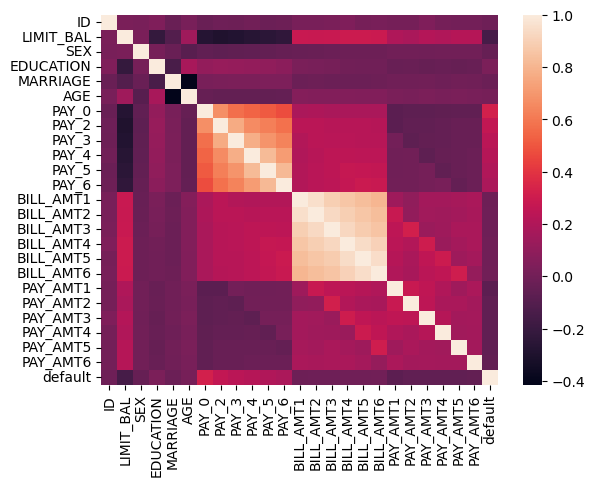

In [21]:
corr = credit_df.corr()
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns)
plt.show()

In [23]:
credit_df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6', 'default'],
      dtype='object')

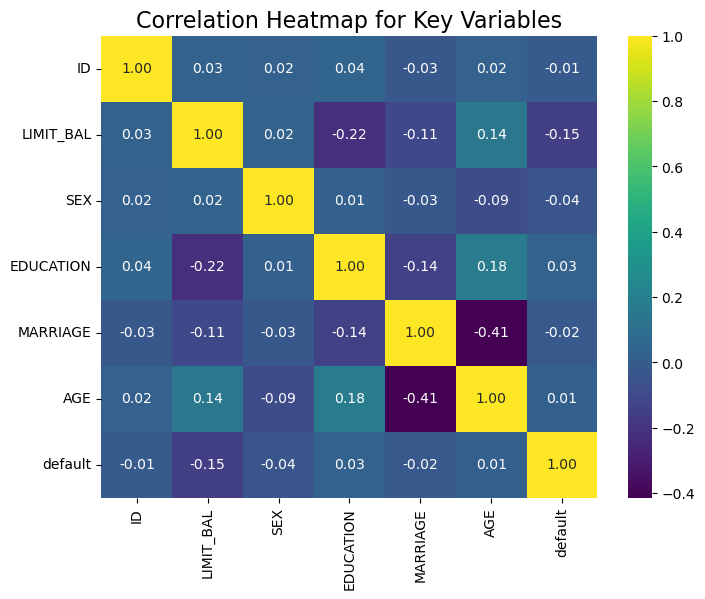

In [25]:
# Select key columns
key_columns = ['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE','default']  # Example
subset_correlation = credit_df[key_columns].corr()

# Plot heatmap for the subset
plt.figure(figsize=(8, 6))
sns.heatmap(subset_correlation, annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heatmap for Key Variables', fontsize=16)
plt.show()


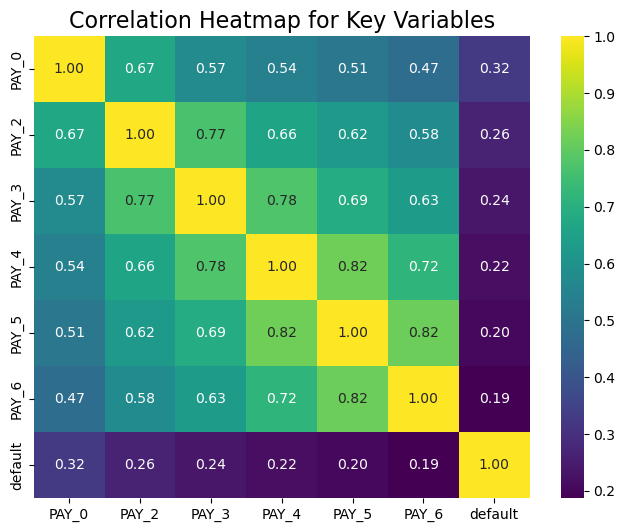

In [31]:
# Select key columns
key_columns1 = ['PAY_0','PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6','default']  # Example
subset_correlation = credit_df[key_columns1].corr()

# Plot heatmap for the subset
plt.figure(figsize=(8, 6))
sns.heatmap(subset_correlation, annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heatmap for Key Variables', fontsize=16)
plt.show()

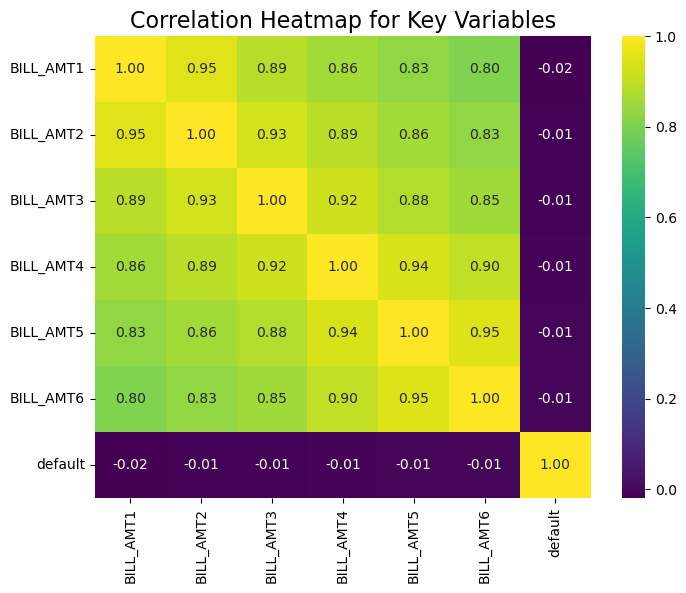

In [35]:
# Select key columns
key_columns2 = ['BILL_AMT1', 'BILL_AMT2','BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6','default']  # Example
subset_correlation = credit_df[key_columns2].corr()

# Plot heatmap for the subset
plt.figure(figsize=(8, 6))
sns.heatmap(subset_correlation, annot=True, cmap='viridis', fmt=".2f")
plt.title('Correlation Heatmap for Key Variables', fontsize=16)
plt.show()